In [1]:
library(ArchR)
set.seed(1)
addArchRThreads(threads = 1)
addArchRGenome("mm10")
library(tidyverse)
library(here)
library(Seurat)
library(ComplexHeatmap)

Loading required package: ggplot2

Loading required package: SummarizedExperiment

Loading required package: GenomicRanges

Loading required package: stats4

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, rownames, sapply, setdiff, sort, table, tapply,
    unio

### Load data

In [2]:
Merged.proj.SC<-readRDS(file="/home/leetl/Gonocyte/Raw_data/SC.subset.newversion/Save-ArchR-Project.rds")

### Save data

In [272]:
saveArchRProject(ArchRProj = Merged.proj.SC,outputDirectory = "SC.subset.newversion", load = TRUE,overwrite = TRUE)

Copying ArchRProject to new outputDirectory : /home/leetl/Gonocyte/Raw_data/SC.subset.newversion

Getting ImputeWeights

Dropping ImputeWeights...

Copying Other Files...

Copying Other Files (1 of 13): Annotations

Copying Other Files (2 of 13): Background-Peaks.rds

Copying Other Files (3 of 13): E18.2

Copying Other Files (4 of 13): Embeddings

Copying Other Files (5 of 13): GroupCoverages

Copying Other Files (6 of 13): IterativeLSI

Copying Other Files (7 of 13): P0.2

Copying Other Files (8 of 13): P3.2

Copying Other Files (9 of 13): P6.2

Copying Other Files (10 of 13): Peak2GeneLinks

Copying Other Files (11 of 13): PeakCalls

Copying Other Files (12 of 13): Plots

Copying Other Files (13 of 13): RNAIntegration

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\ 

class: ArchRProject 
outputDirectory: /home/leetl/Gonocyte/Raw_data/SC.subset.newversion 
samples(4): P3.2 E18.2 P0.2 P6.2
sampleColData names(1): ArrowFiles
cellColData names(27): Sample TSSEnrichment ... FRIP Major_trajectory
numberOfCells(1): 2118
medianTSS(1): 22.522
medianFrags(1): 7289.5

### Dimensionality reduction

Checking Inputs...

ArchR logging to : ArchRLogs/ArchR-addIterativeLSI-382b2cae23b9-Date-2020-10-16_Time-15-54-03.log
If there is an issue, please report to github with logFile!

2020-10-16 15:54:04 : Computing Total Accessibility Across All Features, 0.01 mins elapsed.

2020-10-16 15:54:07 : Computing Top Features, 0.046 mins elapsed.

###########
2020-10-16 15:54:07 : Running LSI (1 of 3) on Top Features, 0.051 mins elapsed.
###########

2020-10-16 15:54:07 : Creating Partial Matrix, 0.051 mins elapsed.

2020-10-16 15:54:14 : Computing LSI, 0.169 mins elapsed.

2020-10-16 15:54:53 : Identifying Clusters, 0.827 mins elapsed.

2020-10-16 15:54:56 : Identified 5 Clusters, 0.877 mins elapsed.

2020-10-16 15:54:56 : Saving LSI Iteration, 0.877 mins elapsed.

2020-10-16 15:55:09 : Creating Cluster Matrix on the total Group Features, 1.083 mins elapsed.

2020-10-16 15:55:39 : Computing Variable Features, 1.583 mins elapsed.

###########
2020-10-16 15:55:39 : Running LSI (2 of 3) on Variable

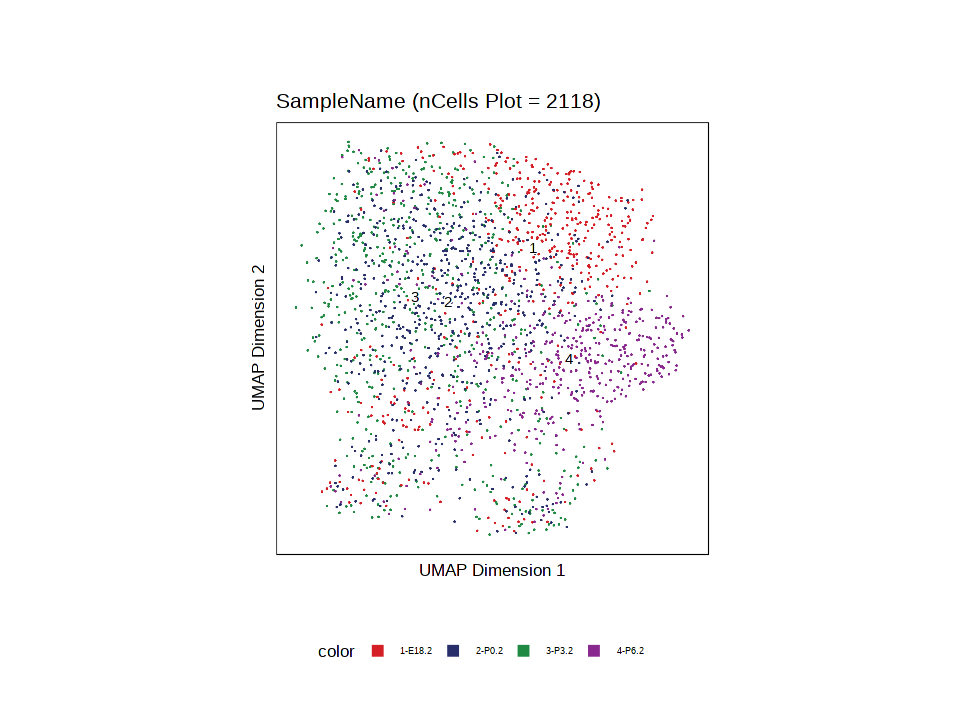

In [203]:
Merged.proj.SC <- addIterativeLSI(
    ArchRProj = Merged.proj.SC,
    useMatrix = "TileMatrix", 
    name = "IterativeLSI", 
    iterations = 3, 
    clusterParams = list( #See Seurat::FindClusters
        resolution = c(0.7), 
        sampleCells = 10000, 
        n.start = 10,
        algorithm= 2    ), 
    varFeatures = 100000, 
    dimsToUse = 1:30,
    force = TRUE
)



In [204]:
Merged.proj.SC <- addUMAP(
    ArchRProj = Merged.proj.SC, 
    reducedDims = "IterativeLSI", 
    name = "UMAP", 
    nNeighbors = 30, 
    minDist = 0.5, 
    metric = "cosine",
    force = TRUE
)

Filtering 1 dims correlated > 0.75 to log10(depth + 1)

15:57:53 UMAP embedding parameters a = 0.583 b = 1.334

15:57:53 Read 2118 rows and found 29 numeric columns

15:57:53 Using Annoy for neighbor search, n_neighbors = 30

15:57:53 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

|

15:57:54 Writing NN index file to temp file /tmp/Rtmp6iyEQt/file382b25ef8904

15:57:54 Searching Annoy index using 12 threads, search_k = 3000

15:57:54 Annoy recall = 100%

15:57:55 Commencing smooth kNN distance calibration using 12 threads

15:57:56 Initializing from normalized Laplacian + noise

15:57:56 Commencing optimization for 500 epochs, with 106418 positive edges

15:57:59 Optimization finished



ArchR logging to : ArchRLogs/ArchR-plotEmbedding-382b1a0c4934-Date-2020-10-16_Time-15-58-49.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
2 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-382b1a0c4934-Date-2020-10-16_Time-15-58-49.log



$Sample

$Seurat.Clusters


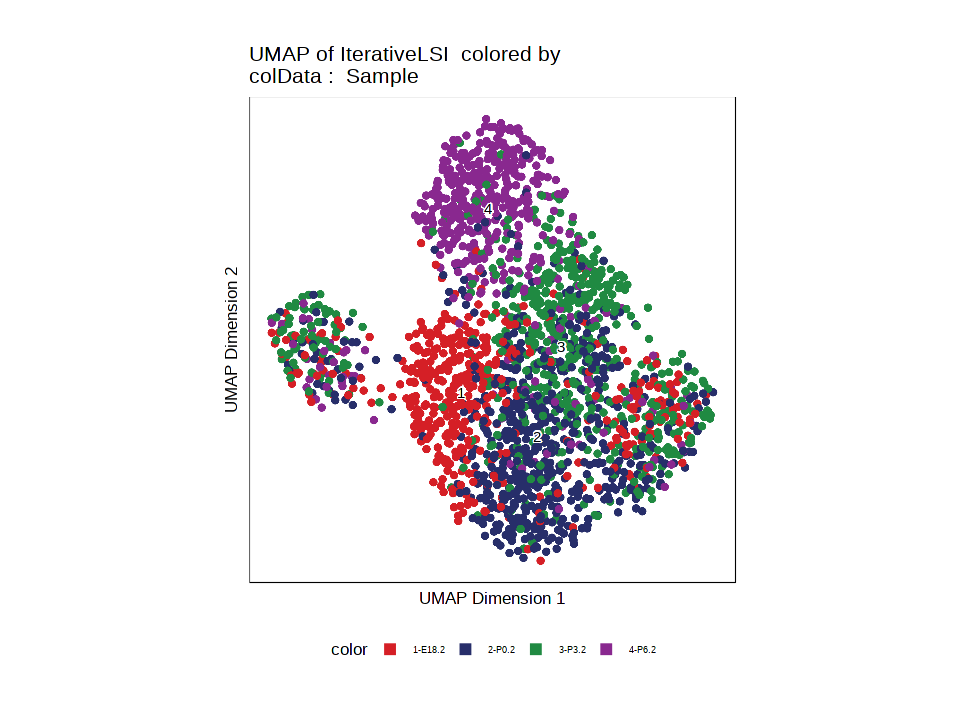

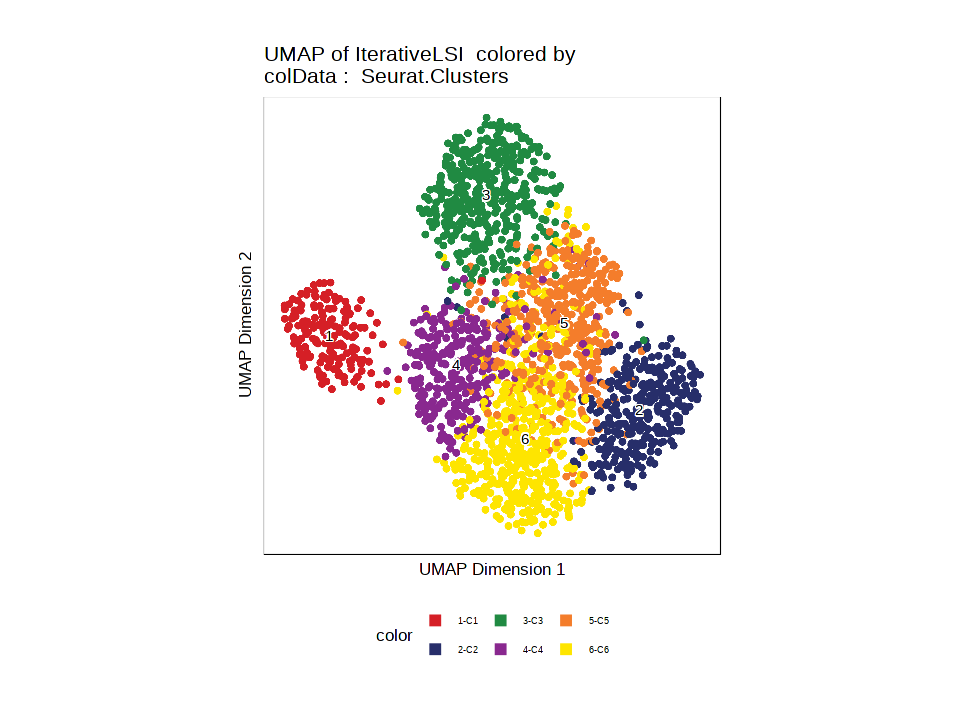

In [207]:
p1 <- plotEmbedding(
    Merged.proj.SC, 
    colorBy = "cellColData", 
    name = c("Sample", "Seurat.Clusters"), 
#      pal = pal,
    size=3,
    plotAs = "points"
)
p1

In [206]:
Merged.proj.SC <- addClusters(
    input = Merged.proj.SC,
    reducedDims = "IterativeLSI",
    method = "Seurat",
    name = "Seurat.Clusters",
    resolution = 1,
    force= TRUE
)

ArchR logging to : ArchRLogs/ArchR-addClusters-382b1c964b83-Date-2020-10-16_Time-15-58-41.log
If there is an issue, please report to github with logFile!

Overriding previous entry for Seurat.Clusters

Filtering 1 dims correlated > 0.75 to log10(depth + 1)

2020-10-16 15:58:41 : Running Seurats FindClusters (Stuart et al. Cell 2019), 0.001 mins elapsed.

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2118
Number of edges: 136044

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.5845
Number of communities: 7
Elapsed time: 0 seconds


2020-10-16 15:58:44 : Testing Biased Clusters, 0.057 mins elapsed.

2020-10-16 15:58:44 : Testing Outlier Clusters, 0.057 mins elapsed.

2020-10-16 15:58:44 : Assigning Outlier Clusters (n = 1, nOutlier < 5 cells) to Neighbors, 0.057 mins elapsed.

2020-10-16 15:58:44 : Assigning Cluster Names to 6 Clusters, 0.058 mins elapsed.

2020-10-16 15:58:44 : Finished addClusters, 0.058 mins elapsed.



### Intetgrate with scRNA-Seq

In [41]:
SC.seRNA <- readRDS("~/Gonocyte/Sertoli.cells.sampleCCA.rds")


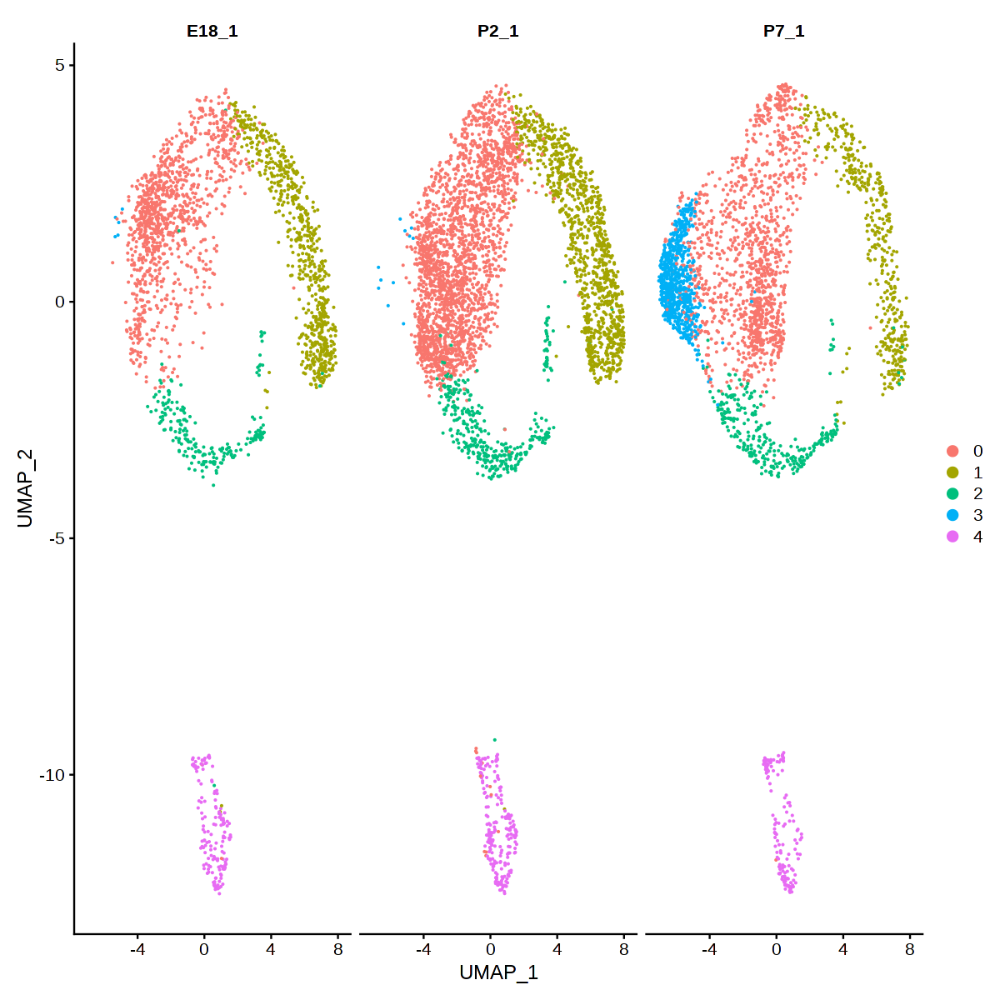

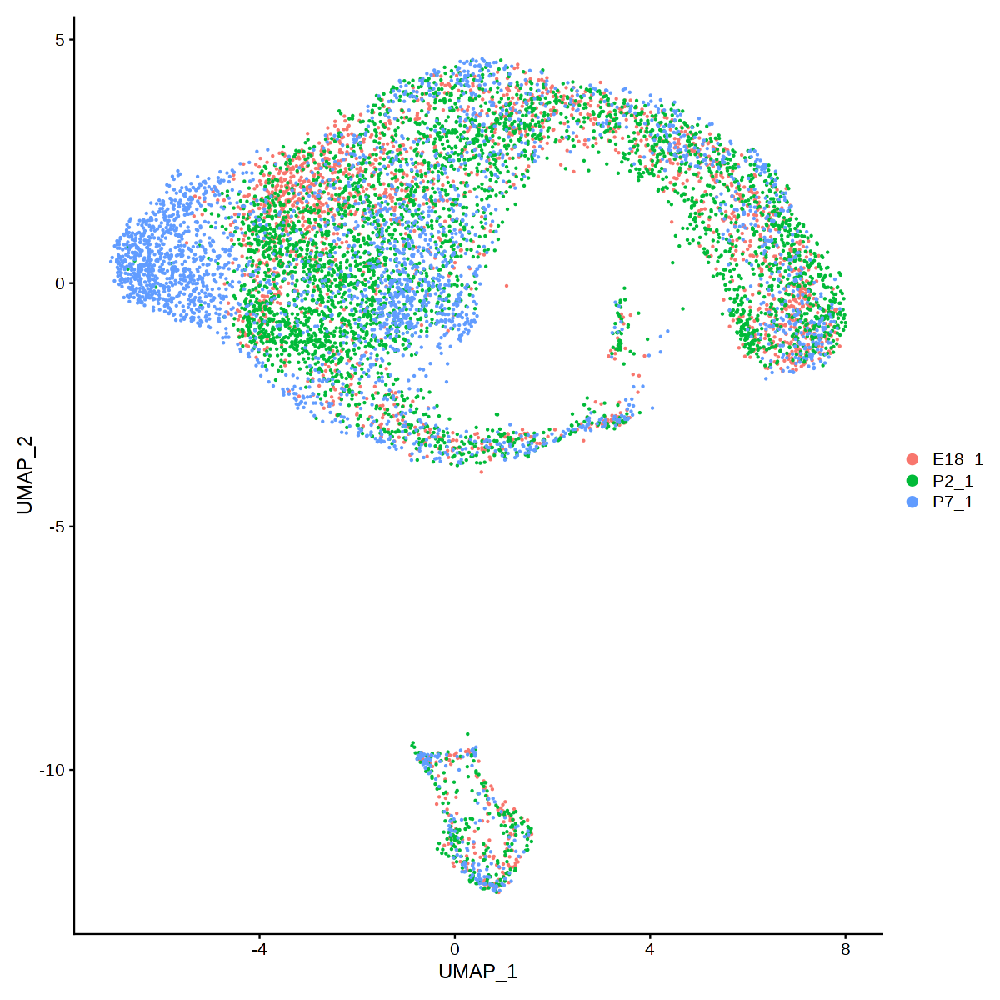

In [46]:
options(repr.plot.height=10,repr.plot.width=10)
DimPlot(SC.seRNA, reduction = "umap",group.by = "seurat_clusters", label = FALSE,split.by="sample",pt.size = 0.1)
DimPlot(SC.seRNA, reduction = "umap",group.by = "sample", label = FALSE)

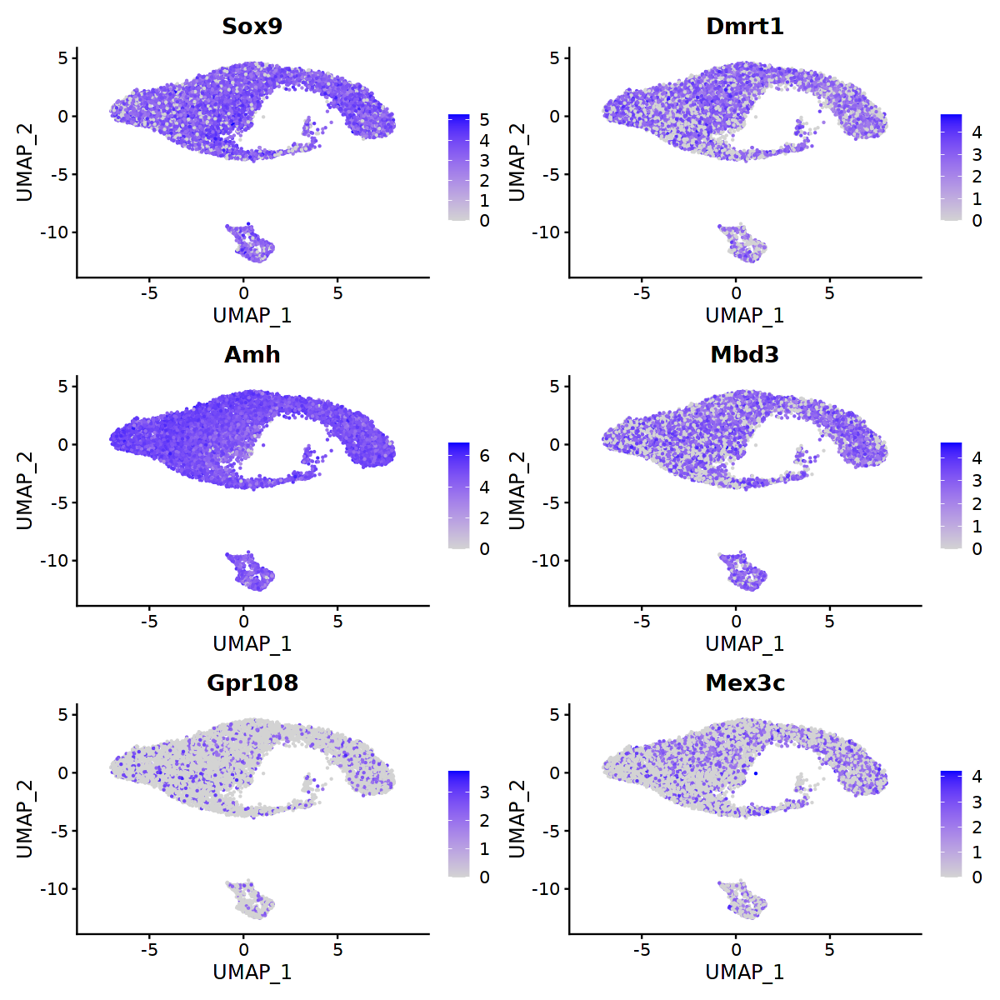

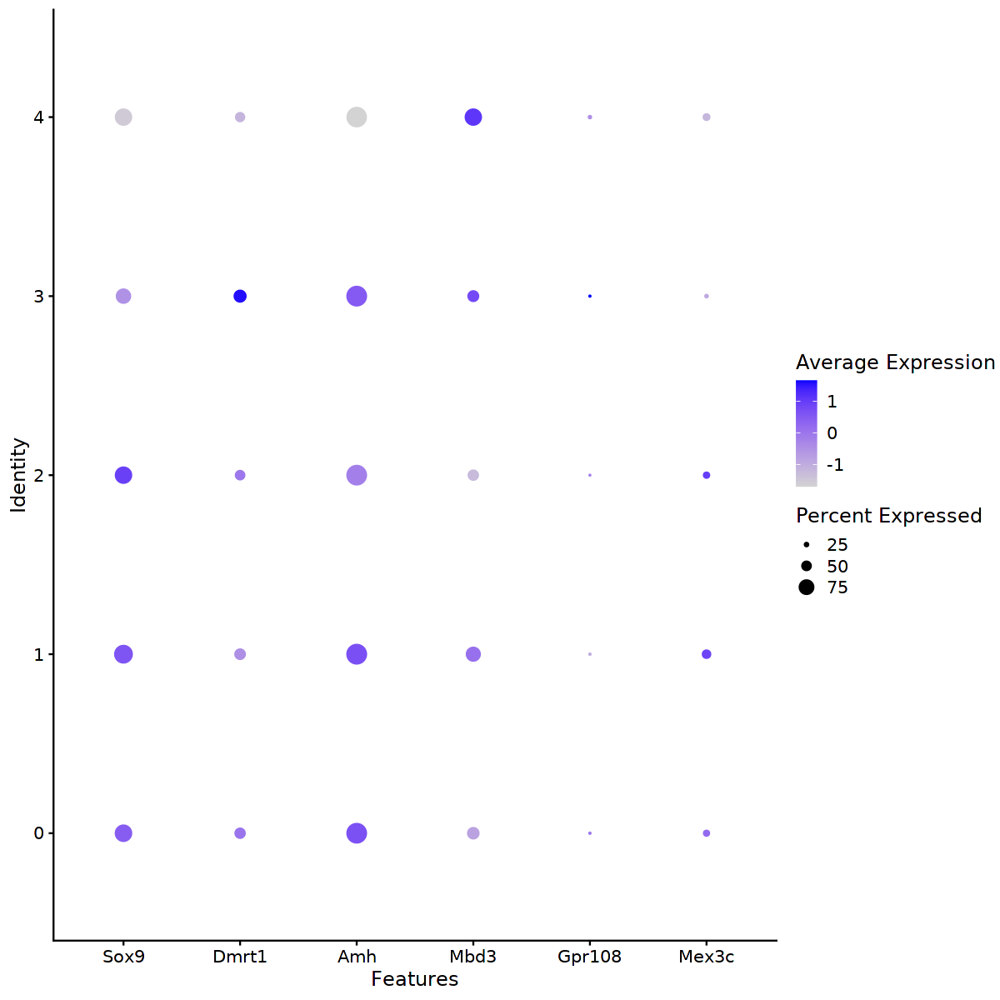

In [389]:
FeaturePlot(SC.seRNA, features = c("Sox9", "Dmrt1", "Amh", "Mbd3", "Gpr108", "Mex3c"))
DotPlot(SC.seRNA, features = c("Sox9", "Dmrt1", "Amh", "Mbd3", "Gpr108", "Mex3c"))


In [42]:
Merged.proj.SC <- addGeneIntegrationMatrix(
    ArchRProj = Merged.proj.SC, 
    useMatrix = "GeneScoreMatrix",
    matrixName = "GeneIntegrationMatrix",
    reducedDims = "IterativeLSI",
    seRNA = SC.seRNA,
    addToArrow = TRUE,
    groupATAC = "Sample",
    #test option below
    groupRNA = "sample",
    nameCell = "predictedCell_Un",
    nameGroup = "predictedGroup_Un",
    nameScore = "predictedScore_Un",
    force = TRUE)

ArchR logging to : ArchRLogs/ArchR-addGeneIntegrationMatrix-382b2ad670bc-Date-2020-10-15_Time-12-01-52.log
If there is an issue, please report to github with logFile!

2020-10-15 12:01:52 : Running Seurat's Integration Stuart* et al 2019, 0.005 mins elapsed.

2020-10-15 12:01:53 : Checking ATAC Input, 0.023 mins elapsed.

2020-10-15 12:01:53 : Checking RNA Input, 0.023 mins elapsed.

2020-10-15 12:01:56 : Creating Integration Blocks, 0.066 mins elapsed.

2020-10-15 12:01:56 : Prepping Interation Data, 0.067 mins elapsed.

Filtering 1 dims correlated > 0.75 to log10(depth + 1)

2020-10-15 12:01:57 : Computing Integration in 1 Integration Blocks!, 0 mins elapsed.

2020-10-15 12:01:57 : Block (1 of 1) : Computing Integration, 0 mins elapsed.

2020-10-15 12:02:02 : Block (1 of 1) : Identifying Variable Genes, 0.095 mins elapsed.

2020-10-15 12:02:08 : Block (1 of 1) : Getting GeneScoreMatrix, 0.187 mins elapsed.

2020-10-15 12:02:13 : Block (1 of 1) : Imputing GeneScoreMatrix, 0.276 mins e

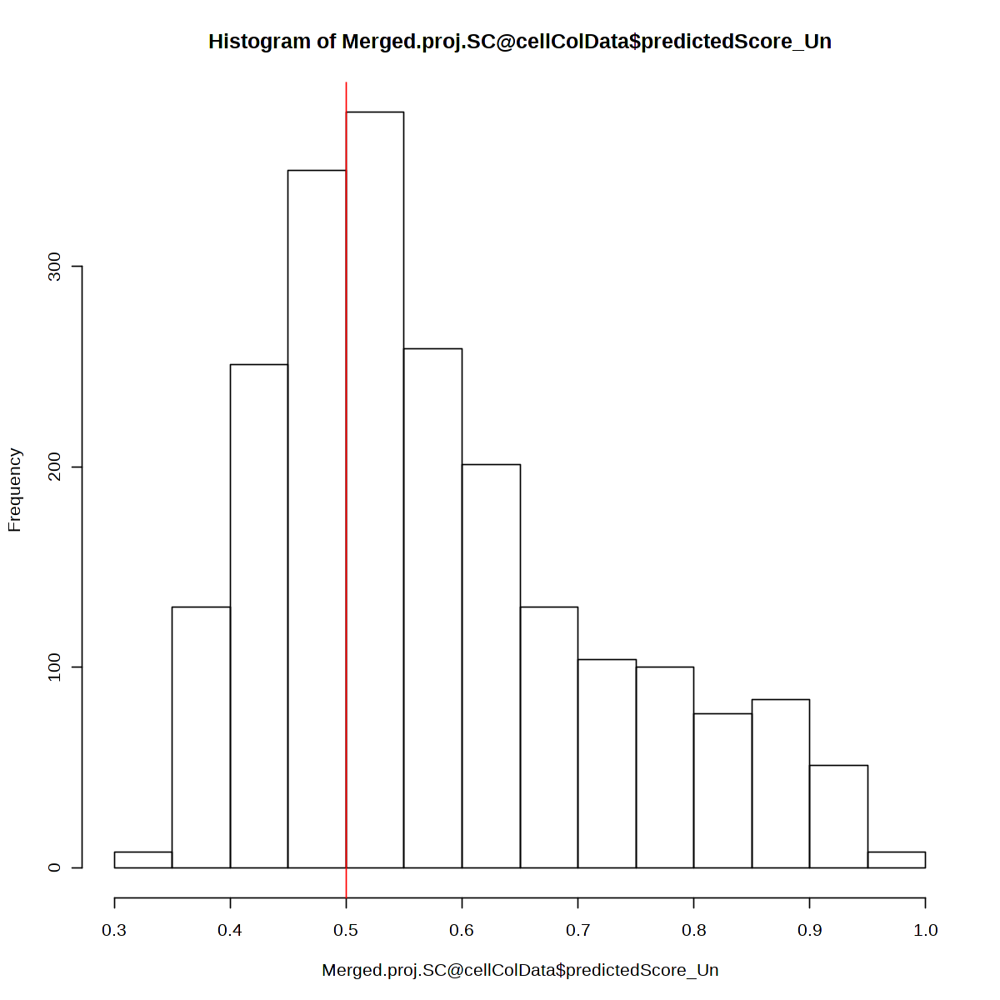

In [48]:
hist(Merged.proj.SC@cellColData$predictedScore_Un)
abline(v = 0.5, col = "red")

In [228]:
getAvailableMatrices(Merged.proj.SC)


[1] "GeneIntegrationMatrix" "GeneScoreMatrix"       "MotifMatrix"          
[4] "PeakMatrix"            "TileMatrix"

In [356]:
Merged.proj.SC <- addImputeWeights(Merged.proj.SC,k=19,ka=3,td=2)

ArchR logging to : ArchRLogs/ArchR-addImputeWeights-382b387b5e9f-Date-2020-10-19_Time-14-47-29.log
If there is an issue, please report to github with logFile!

2020-10-19 14:47:30 : Computing Impute Weights Using Magic (Cell 2018), 0 mins elapsed.

Filtering 1 dims correlated > 0.75 to log10(depth + 1)



### Peak calling

In [230]:
pathToMacs2 <- findMacs2()
Merged.proj.SC <- addReproduciblePeakSet(
    ArchRProj = Merged.proj.SC, 
    groupBy = "Seurat.Clusters", 
    pathToMacs2 = pathToMacs2
)


Searching For MACS2..

Found with $path!

ArchR logging to : ArchRLogs/ArchR-addReproduciblePeakSet-382b65d3bbe1-Date-2020-10-16_Time-16-54-11.log
If there is an issue, please report to github with logFile!

Calling Peaks with Macs2

2020-10-16 16:54:11 : Peak Calling Parameters!, 0.012 mins elapsed.



   Group nCells nCellsUsed nReplicates nMin nMax maxPeaks
C1    C1    174        182           3   51   79    91000
C2    C2    300        195           3   41   99    97500
C3    C3    416        416           2   67  349   150000
C4    C4    292        352           3   45  241   150000
C5    C5    421        363           3   42  181   150000
C6    C6    515        505           3   65  330   150000


2020-10-16 16:54:11 : Batching Peak Calls!, 0.012 mins elapsed.

2020-10-16 16:54:11 : Batch Execution w/ safelapply!, 0 mins elapsed.

2020-10-16 16:54:11 : Group 1 of 17, Calling Peaks with MACS2!, 0 mins elapsed.

Running Macs2 with Params : macs2 callpeak -g 1.87e+09 --name C1._.P3.2-1 --treatment /home/leetl/Gonocyte/Raw_data/Allcell.202009.wodoublet.filtering/PeakCalls/InsertionBeds/C1._.P3.2-1.insertions.bed --outdir /home/leetl/Gonocyte/Raw_data/Allcell.202009.wodoublet.filtering/PeakCalls/InsertionBeds --format BED --call-summits --keep-dup all --nomodel --nolambda --shift -75 --extsize 150 -q 0.1

2020-10-16 16:54:48 : Group 2 of 17, Calling Peaks with MACS2!, 0.605 mins elapsed.

Running Macs2 with Params : macs2 callpeak -g 1.87e+09 --name C1._.P0.2-2 --treatment /home/leetl/Gonocyte/Raw_data/Allcell.202009.wodoublet.filtering/PeakCalls/InsertionBeds/C1._.P0.2-2.insertions.bed --outdir /home/leetl/Gonocyte/Raw_data/Allcell.202009.wodoublet.filtering/PeakCalls/InsertionBeds 

[1] "/home/leetl/Gonocyte/Raw_data/Allcell.202009.wodoublet.filtering/PeakCalls/C1-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/leetl/Gonocyte/Raw_data/Allcell.202009.wodoublet.filtering/PeakCalls/C2-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/leetl/Gonocyte/Raw_data/Allcell.202009.wodoublet.filtering/PeakCalls/C3-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/leetl/Gonocyte/Raw_data/Allcell.202009.wodoublet.filtering/PeakCalls/C4-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/leetl/Gonocyte/Raw_data/Allcell.202009.wodoublet.filtering/PeakCalls/C5-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/leetl/Gonocyte/Raw_data/Allcell.202009.wodoublet.filtering/PeakCalls/C6-reproduciblePeaks.gr.rds"


2020-10-16 17:03:18 : Creating Union Peak Set!, 9.116 mins elapsed.

Converged after 5 iterations!

Plotting Ggplot!

2020-10-16 17:03:21 : Finished Creating Union Peak Set (72026)!, 9.167 mins elapsed.



In [231]:
Merged.proj.SC <- addPeakMatrix(Merged.proj.SC)

ArchR logging to : ArchRLogs/ArchR-addPeakMatrix-382b75e151dd-Date-2020-10-16_Time-17-03-21.log
If there is an issue, please report to github with logFile!

2020-10-16 17:03:21 : Batch Execution w/ safelapply!, 0 mins elapsed.

.createArrowGroup : Arrow Group already exists! Dropping Group from ArrowFile! This will take ~10-30 seconds!

.dropGroupsFromArrow : Initializing Temp ArrowFile

.dropGroupsFromArrow : Adding Metadata to Temp ArrowFile

.dropGroupsFromArrow : Adding SubGroups to Temp ArrowFile

.dropGroupsFromArrow : Move Temp ArrowFile to ArrowFile

2020-10-16 17:03:32 : Adding P3.2 to PeakMatrix for Chr (1 of 20)!, 0.004 mins elapsed.

2020-10-16 17:03:35 : Adding P3.2 to PeakMatrix for Chr (2 of 20)!, 0.039 mins elapsed.

2020-10-16 17:03:37 : Adding P3.2 to PeakMatrix for Chr (3 of 20)!, 0.075 mins elapsed.

2020-10-16 17:03:39 : Adding P3.2 to PeakMatrix for Chr (4 of 20)!, 0.109 mins elapsed.

2020-10-16 17:03:41 : Adding P3.2 to PeakMatrix for Chr (5 of 20)!, 0.145 mins 

In [232]:
Merged.proj.SC <- addMotifAnnotations(ArchRProj = Merged.proj.SC, motifSet = "cisbp", name = "Motif",force = TRUE)
Merged.proj.SC <- addBgdPeaks(Merged.proj.SC)


ArchR logging to : ArchRLogs/ArchR-addMotifAnnotations-382b20773c58-Date-2020-10-16_Time-17-06-46.log
If there is an issue, please report to github with logFile!

peakAnnotation name already exists! Overriding.

2020-10-16 17:06:47 : Gettting Motif Set, Species : Mus musculus, 0.007 mins elapsed.

Using version 2 motifs!

2020-10-16 17:06:48 : Finding Motif Positions with motifmatchr!, 0.029 mins elapsed.

2020-10-16 17:07:48 : Creating Motif Overlap Matrix, 1.032 mins elapsed.

2020-10-16 17:07:49 : Finished Getting Motif Info!, 1.044 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-addMotifAnnotations-382b20773c58-Date-2020-10-16_Time-17-06-46.log

Identifying Background Peaks!



In [233]:
Merged.proj.SC <- addDeviationsMatrix(
  ArchRProj = Merged.proj.SC, 
  peakAnnotation = "Motif",
  force = TRUE
)

Using Previous Background Peaks!

ArchR logging to : ArchRLogs/ArchR-addDeviationsMatrix-382b53ae808a-Date-2020-10-16_Time-17-07-53.log
If there is an issue, please report to github with logFile!



NULL


2020-10-16 17:07:56 : Batch Execution w/ safelapply!, 0 mins elapsed.

.createArrowGroup : Arrow Group already exists! Dropping Group from ArrowFile! This will take ~10-30 seconds!

.dropGroupsFromArrow : Initializing Temp ArrowFile

.dropGroupsFromArrow : Adding Metadata to Temp ArrowFile

.dropGroupsFromArrow : Adding SubGroups to Temp ArrowFile

.dropGroupsFromArrow : Move Temp ArrowFile to ArrowFile

2020-10-16 17:08:07 : chromVAR deviations P3.2 (1 of 4) Schep (2017), 0.181 mins elapsed.

2020-10-16 17:08:13 : P3.2 (1 of 4) : Deviations for Annotation 44 of 884, 0.092 mins elapsed.

2020-10-16 17:08:20 : P3.2 (1 of 4) : Deviations for Annotation 88 of 884, 0.196 mins elapsed.

2020-10-16 17:08:25 : P3.2 (1 of 4) : Deviations for Annotation 132 of 884, 0.293 mins elapsed.

2020-10-16 17:08:33 : P3.2 (1 of 4) : Deviations for Annotation 176 of 884, 0.426 mins elapsed.

2020-10-16 17:08:41 : P3.2 (1 of 4) : Deviations for Annotation 220 of 884, 0.561 mins elapsed.

2020-10-16 17:08:4

In [133]:
#saveArchRProject(ArchRProj = Merged.proj.SC, load = FALSE)

Copying Arrow Files...

Copying Arrow Files (1 of 4)

Copying Arrow Files (2 of 4)

Copying Arrow Files (3 of 4)

Copying Arrow Files (4 of 4)

Saving ArchRProject...



### Find marker genes

In [211]:
markersGS <- getMarkerFeatures(
    ArchRProj = Merged.proj.SC, 
    useMatrix = "GeneScoreMatrix", 
    groupBy = "Seurat.Clusters",
    bias = c("TSSEnrichment", "log10(nFrags)"),
    k = 500,
    normBy = "ReadsInTSS",
    testMethod = "wilcoxon"
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-382b69d6e62-Date-2020-10-16_Time-16-01-17.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Double.Matrix

2020-10-16 16:01:17 : Matching Known Biases, 0.001 mins elapsed.

2020-10-16 16:01:19 : Computing Pairwise Tests (1 of 6), 0.02 mins elapsed.

2020-10-16 16:01:43 : Computing Pairwise Tests (2 of 6), 0.431 mins elapsed.

2020-10-16 16:02:07 : Computing Pairwise Tests (3 of 6), 0.832 mins elapsed.

2020-10-16 16:02:32 : Computing Pairwise Tests (4 of 6), 1.238 mins elapsed.

2020-10-16 16:02:56 : Computing Pairwise Tests (5 of 6), 1.638 mins elapsed.

2020-10-16 16:03:20 : Computing Pairwise Tests (6 of 6), 2.044 mins elapsed.

###########
2020-10-16 16:03:45 : Completed Pairwise Tests, 2.455 mins elapsed.
###########

ArchR logging successful to : ArchRLogs/ArchR-getMarkerFeatures-382b69d6e62-Date-2020-10-16_Time-16-01-17.log



In [223]:
options(repr.plot.width=5,repr.plot.height=30)
heatmapGS <- plotMarkerHeatmap(
  seMarker = markersGS, 
  cutOff = "FDR <= 0.1 & Log2FC >= 0.5", 
 labelMarkers = markerGenes,
  transpose = TRUE
)

ArchR logging to : ArchRLogs/ArchR-plotMarkerHeatmap-382b5a874ef9-Date-2020-10-16_Time-16-28-32.log
If there is an issue, please report to github with logFile!

Printing Top Marker Genes:

C1:

	Ogfrl1, Npas2, Slco6c1, Ifi207, Midn, Cirbp, Mbd3, Mknk2, Oaz1, Fzr1, Dohh, Gm21312, Mbd6, Ddit3, Nemp1, Egfr, Timd2, Rian, Sp4, Gtpbp4

C2:

	Ogfrl1, Npas2, Slco6c1, Ifi207, Midn, Cirbp, Mbd3, Mknk2, Oaz1, Fzr1, Dohh, Gm21312, Mbd6, Ddit3, Nemp1, Egfr, Timd2, Slc36a3, Rian, Sp4

C3:

	Slc36a3, Ccdc184, Olfr288, Impg2, Meig1, Rimbp2, Glb1l2, Trpc1, Ogfrl1, Npas2, Slco6c1, Ifi207, Midn, Cirbp, Mbd3, Mknk2, Oaz1, Fzr1, Dohh, Gm21312

C4:

	Ogfrl1, Npas2, Slco6c1, Ifi207, Midn, Cirbp, Mbd3, Mknk2, Oaz1, Fzr1, Dohh, Gm21312, Mbd6, Ddit3, Nemp1, Egfr, Timd2, Slc36a3, Rian, Sp4

C5:

	Ogfrl1, Npas2, Slco6c1, Ifi207, Midn, Cirbp, Mbd3, Mknk2, Oaz1, Fzr1, Dohh, Gm21312, Mbd6, Ddit3, Nemp1, Egfr, Timd2, Slc36a3, Rian, Sp4

C6:

	Ptk2b, Ogfrl1, Npas2, Slco6c1, Ifi207, Midn, Cirbp, Mbd3, Mknk2, Oaz1, Fzr1

In [226]:
pdf("SC.markergene.pdf", width=6, height=4)
#options(repr.plot.height=20,repr.plot.width=8)
ComplexHeatmap::draw(heatmapGS, heatmap_legend_side = "bot", annotation_legend_side = "bot")
dev.off()

png 
  2

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-7b66712dcd84-Date-2020-08-27_Time-12-14-28.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2020-08-27 12:14:28 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Plotting Embedding

1 
2 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-7b66712dcd84-Date-2020-08-27_Time-12-14-28.log



$Dmrt1

$Sox9


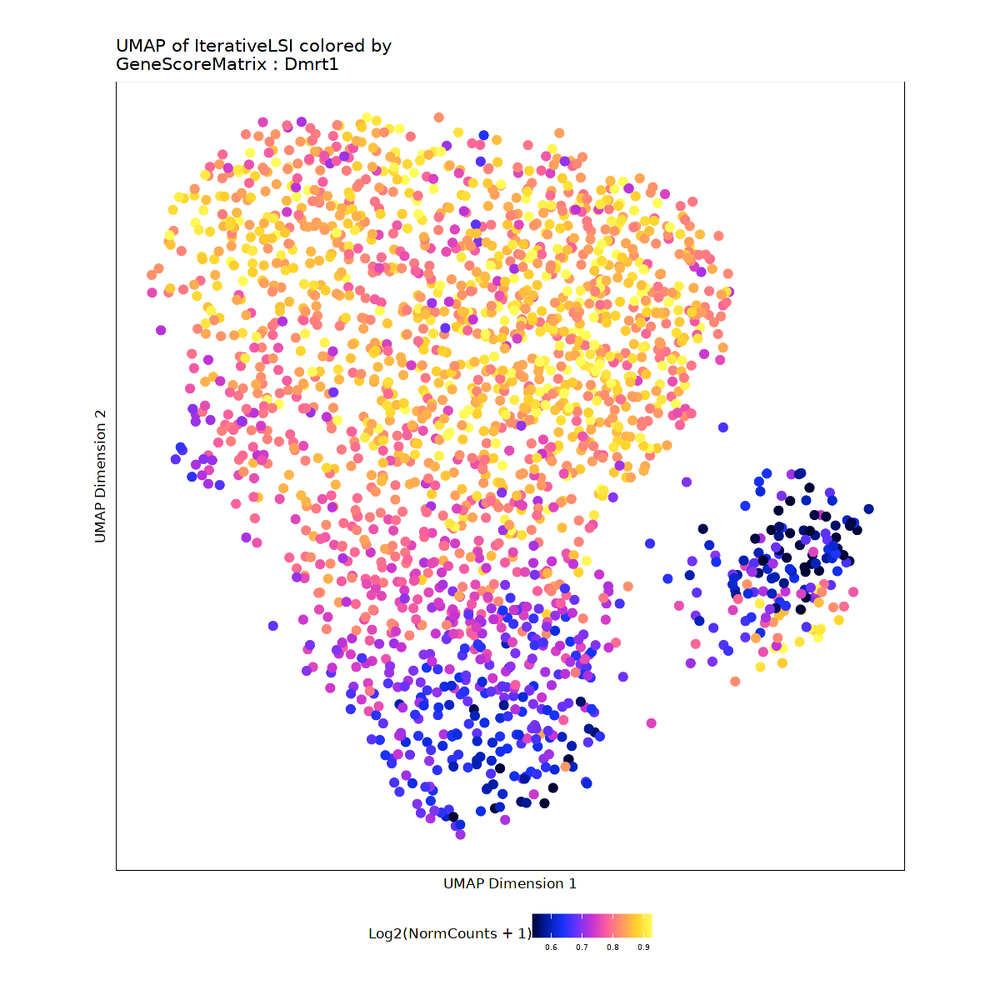

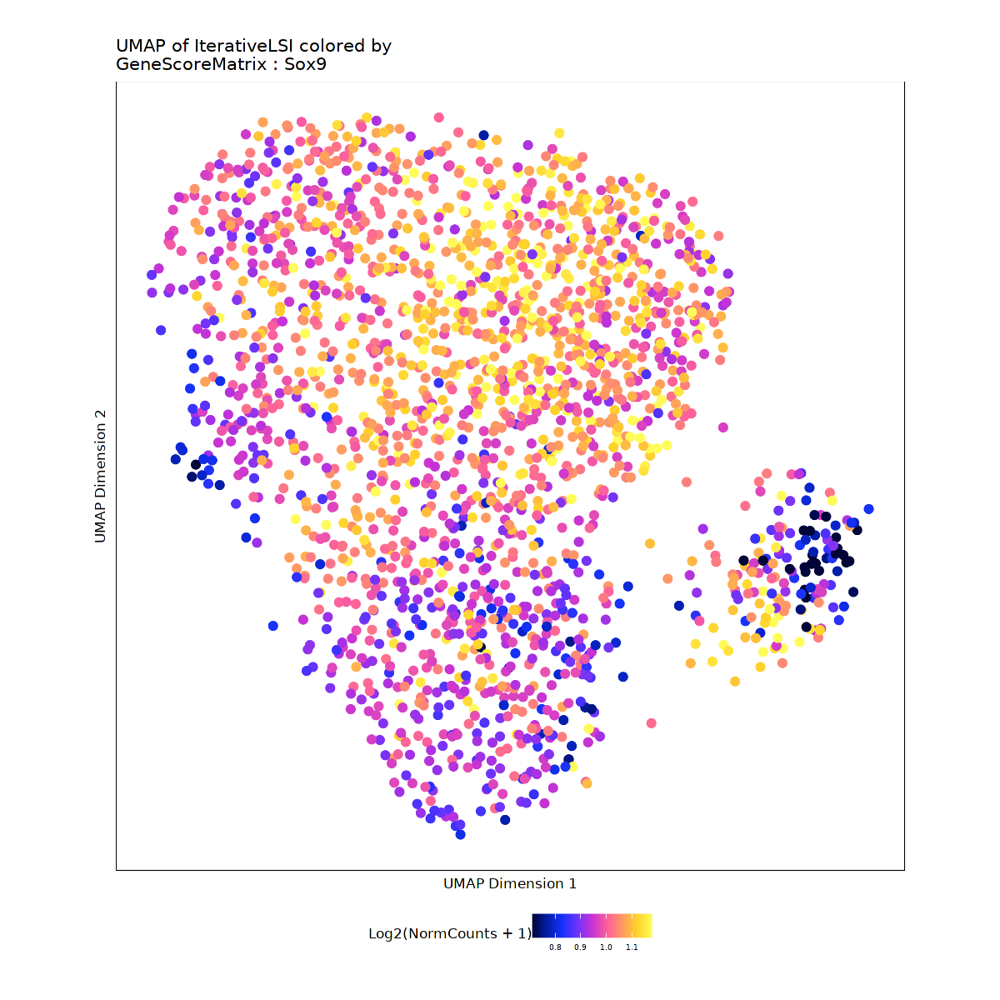

In [398]:
p <- plotEmbedding(
    ArchRProj = Merged.proj.SC, 
    colorBy = "GeneScoreMatrix", 
    name = c("Dmrt1", "Sox9"), 
    embedding = "UMAP",
    quantCut = c(0.01, 0.95),
    imputeWeights = getImputeWeights(Merged.proj.SC),
    plotAs = "point",
    size =2 
)
p

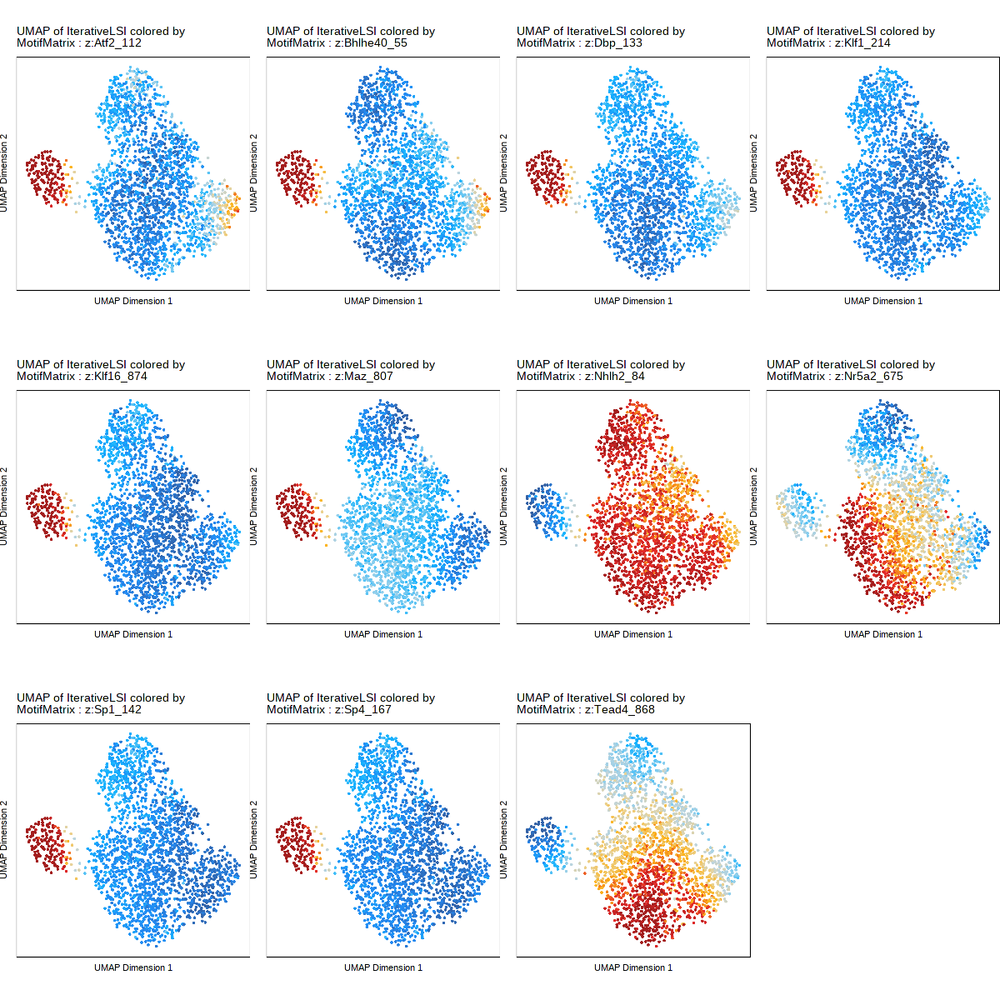

In [351]:
options(repr.plot.height=10,repr.plot.width=10)
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 4),p2))

In [348]:
motifs <- c("Atf2", "Bhlhe40", "Dbp", "Klf1", "Klf16", "Maz", "Nhlh2", "Nr5a2", "Sp1", "Sp4", "Tead4")
markerMotifs <- getFeatures(Merged.proj.SC, select = paste(motifs, collapse="|"), useMatrix = "MotifMatrix")
markerMotifs <- grep("z:", markerMotifs, value = TRUE)
# markerMotifs <- markerMotifs[markerMotifs %ni% "z:Fosl2_113"]   ##for removing
markerMotifs

[1] "z:Klf16_874"  "z:Tead4_868"  "z:Klf13_817"  "z:Klf10_810"  "z:Maz_807"   
 [6] "z:Klf15_806"  "z:Klf11_798"  "z:Sp110_718"  "z:Sp140_717"  "z:Sp100_714" 
[11] "z:Nr5a2_675"  "z:Klf14_237"  "z:Klf12_236"  "z:Klf1_214"   "z:Sp4_167"   
[16] "z:Sp1_142"    "z:Dbp_133"    "z:Atf2_112"   "z:Nhlh2_84"   "z:Mesp1_58"  
[21] "z:Bhlhe40_55"

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-382b1943da5b-Date-2020-10-19_Time-10-39-45.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = MotifMatrix

Getting Matrix Values...

2020-10-19 10:39:45 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 
11 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-382b1943da5b-Date-2020-10-19_Time-10-39-45.log



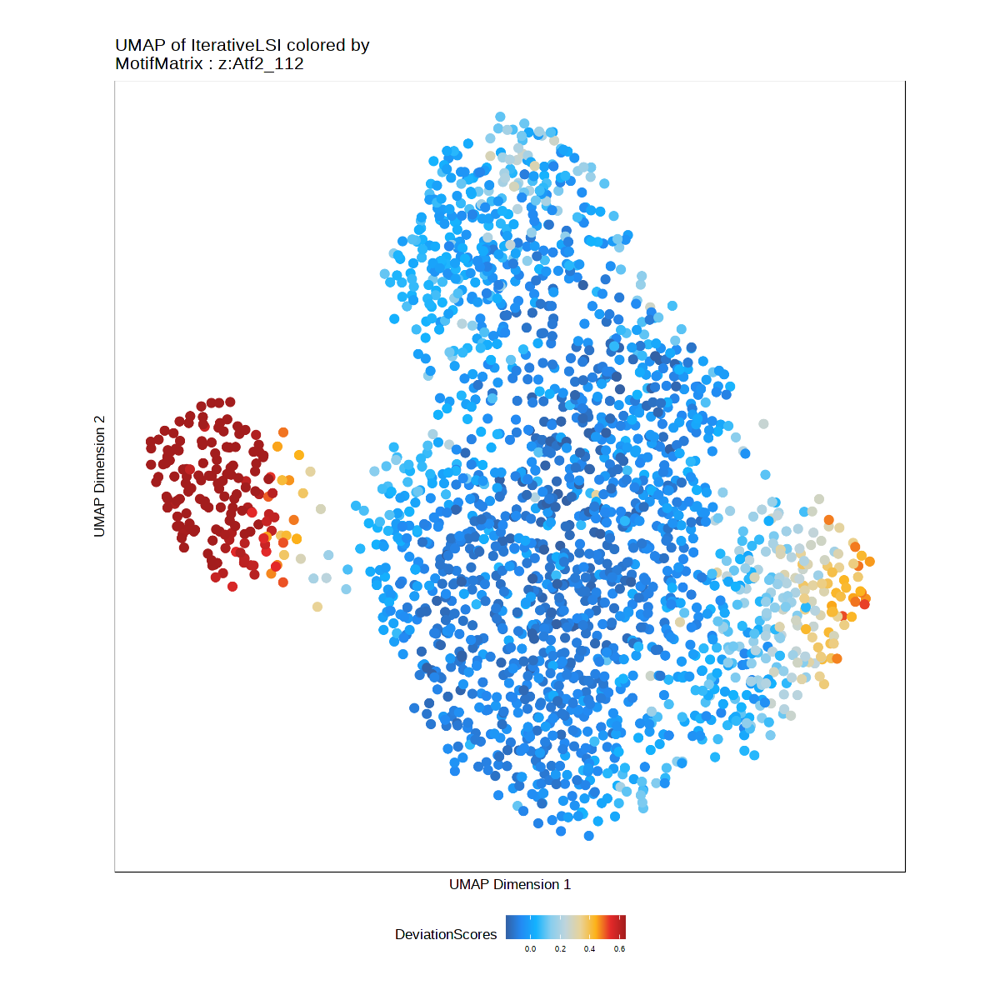

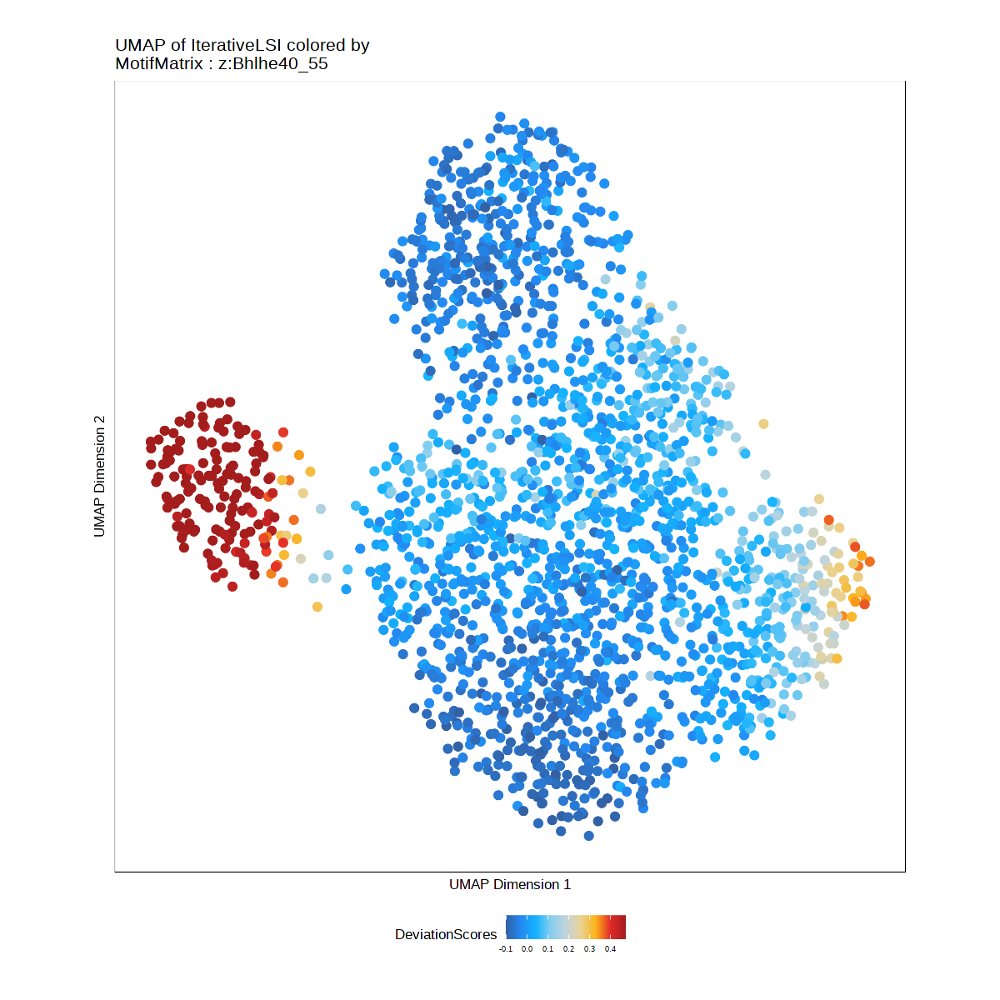

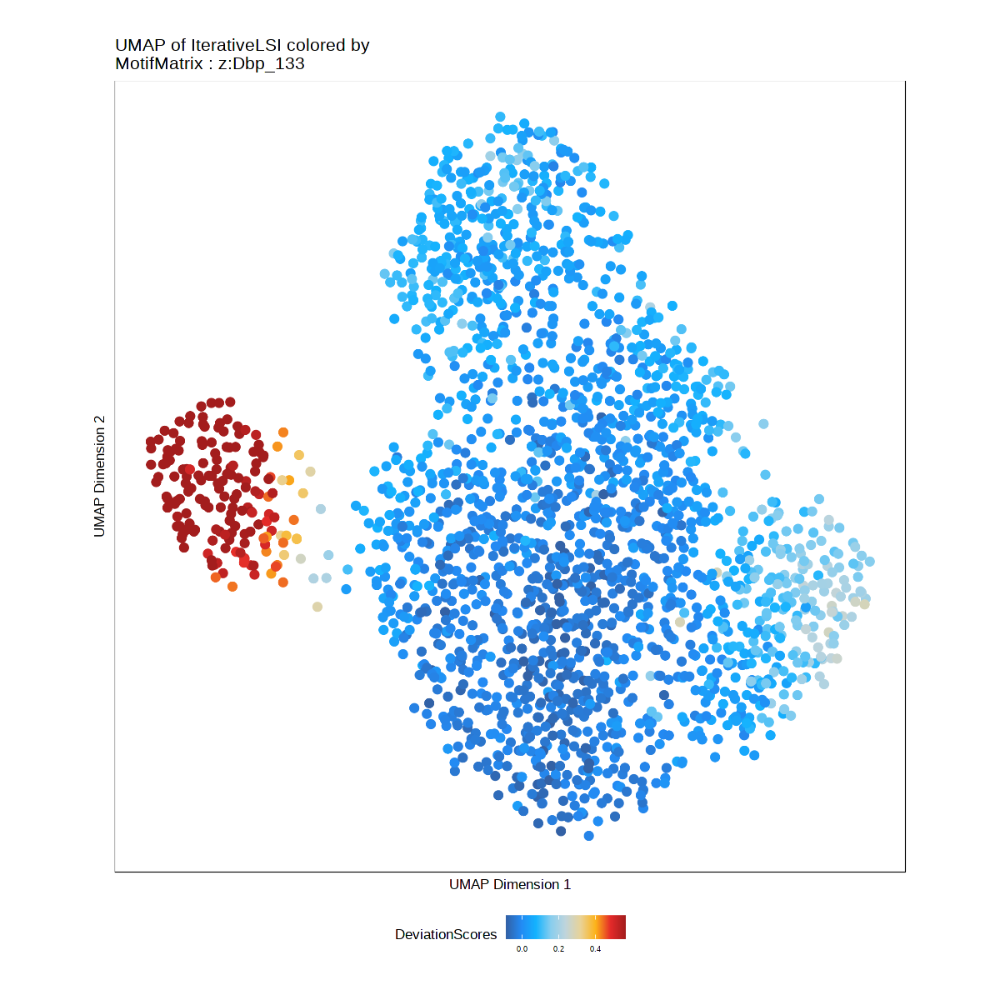

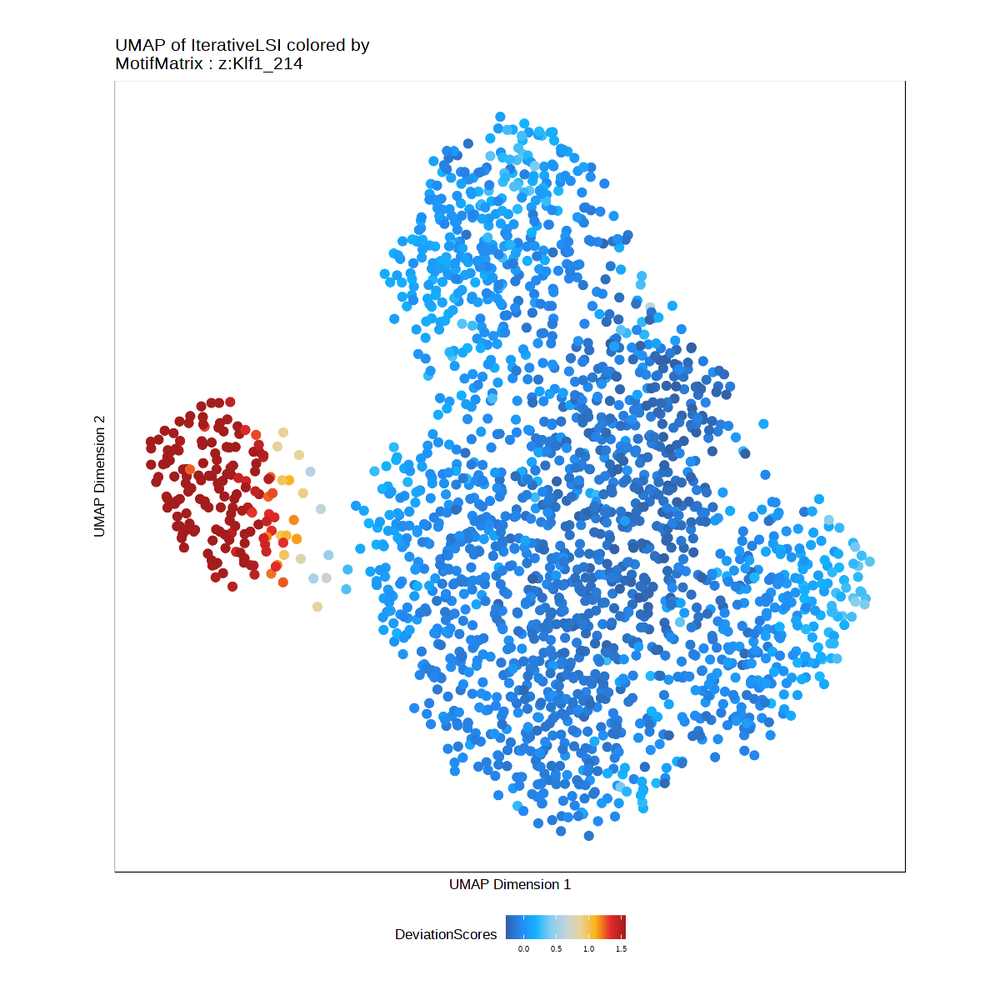

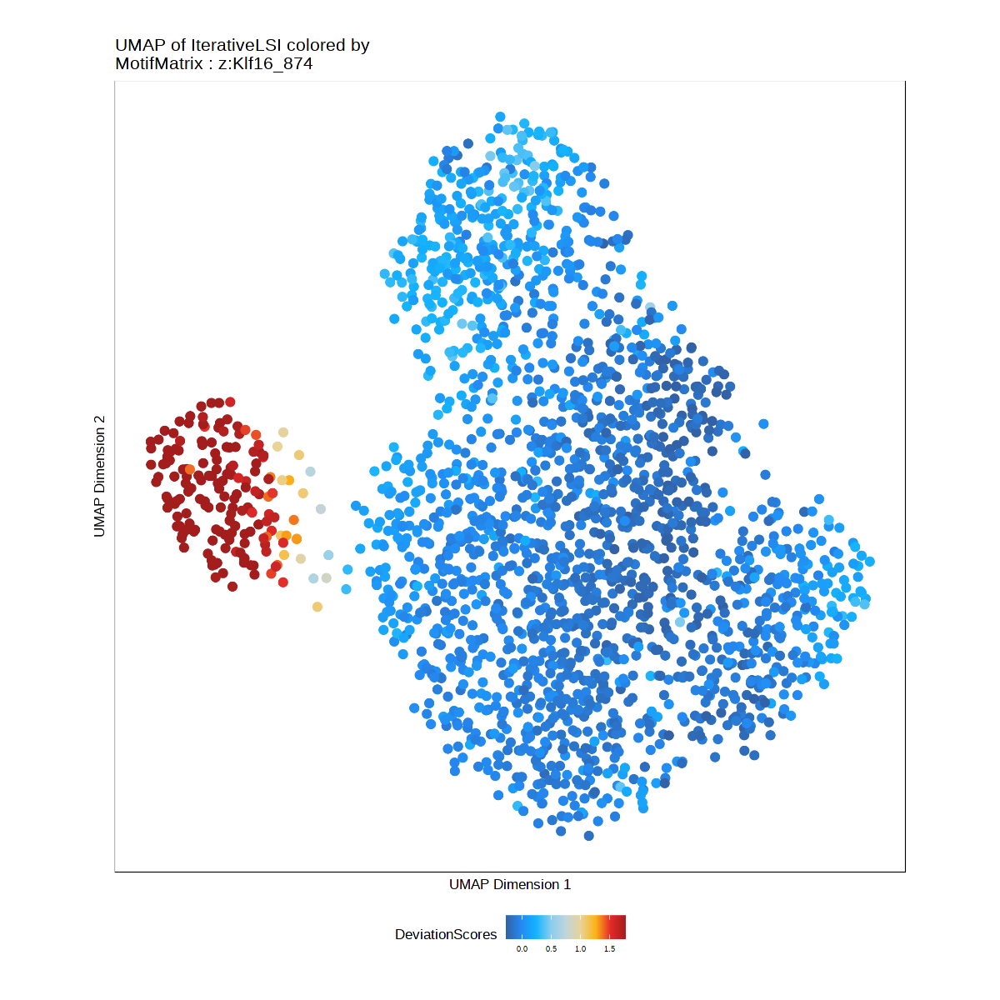

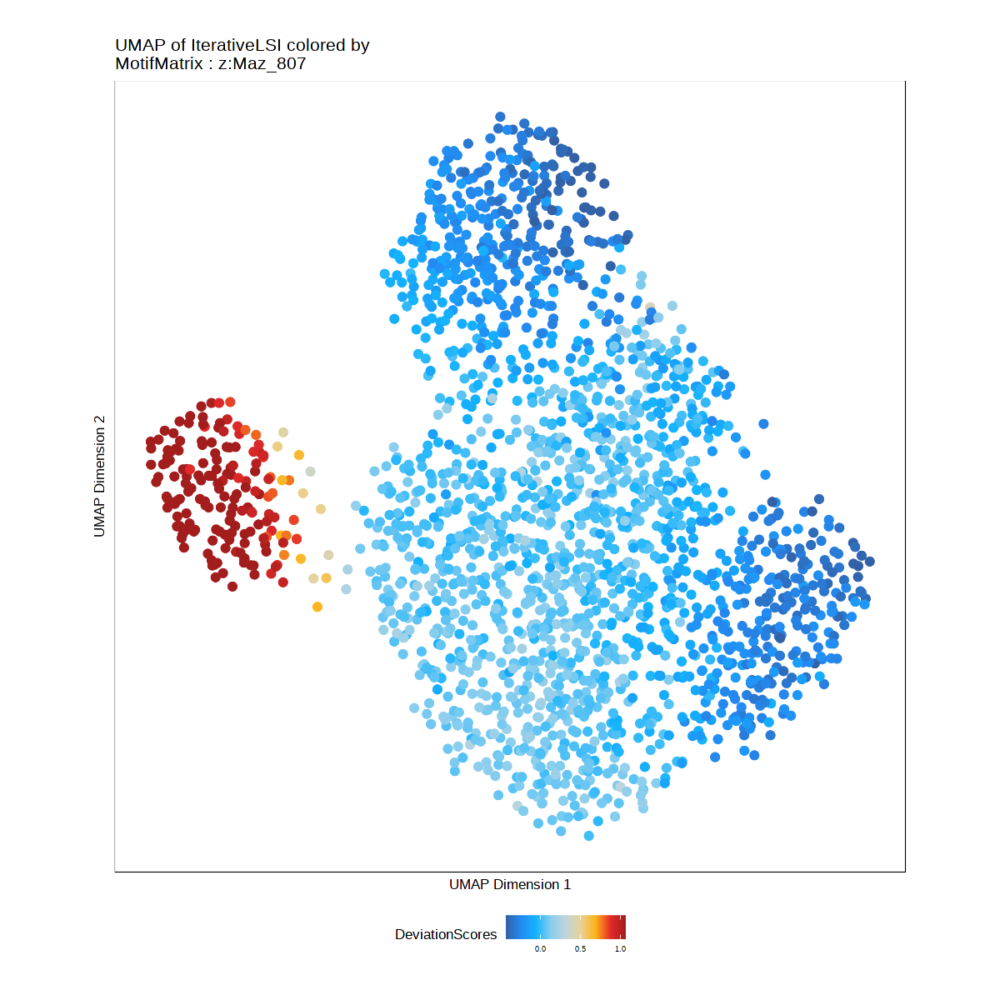

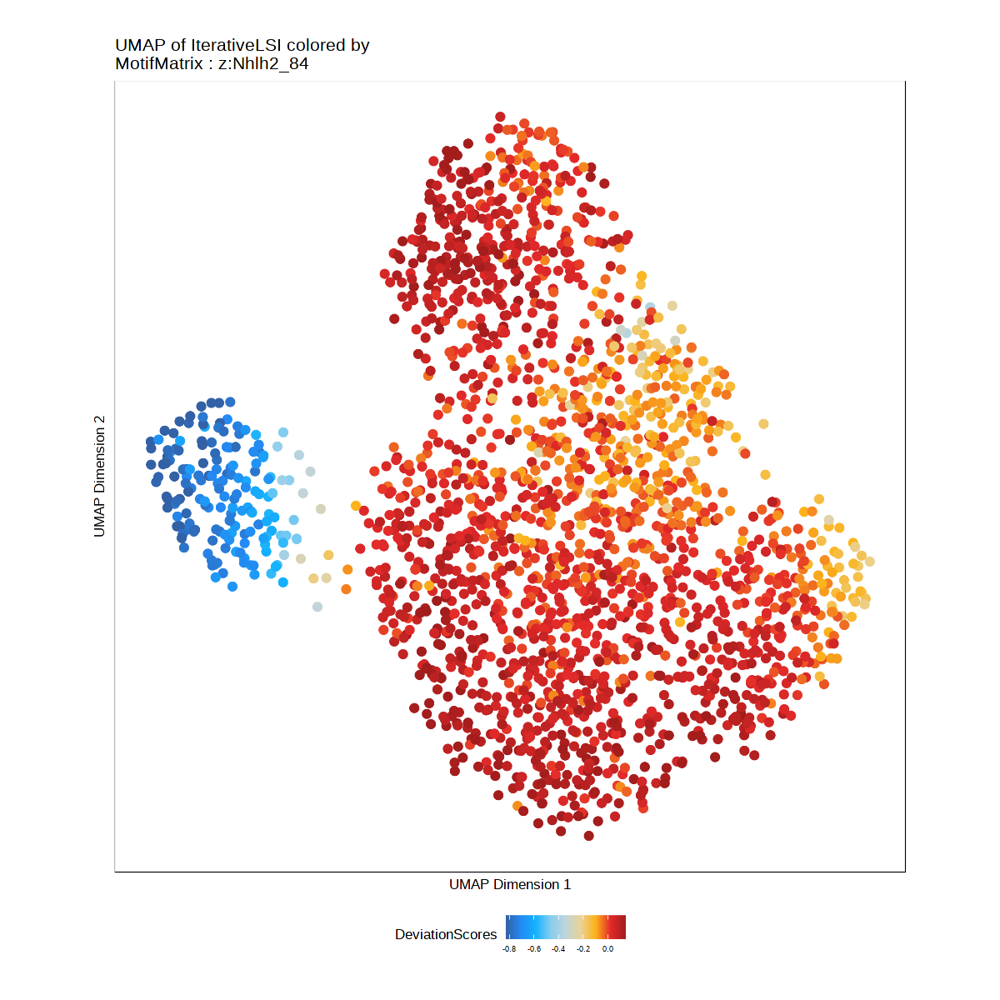

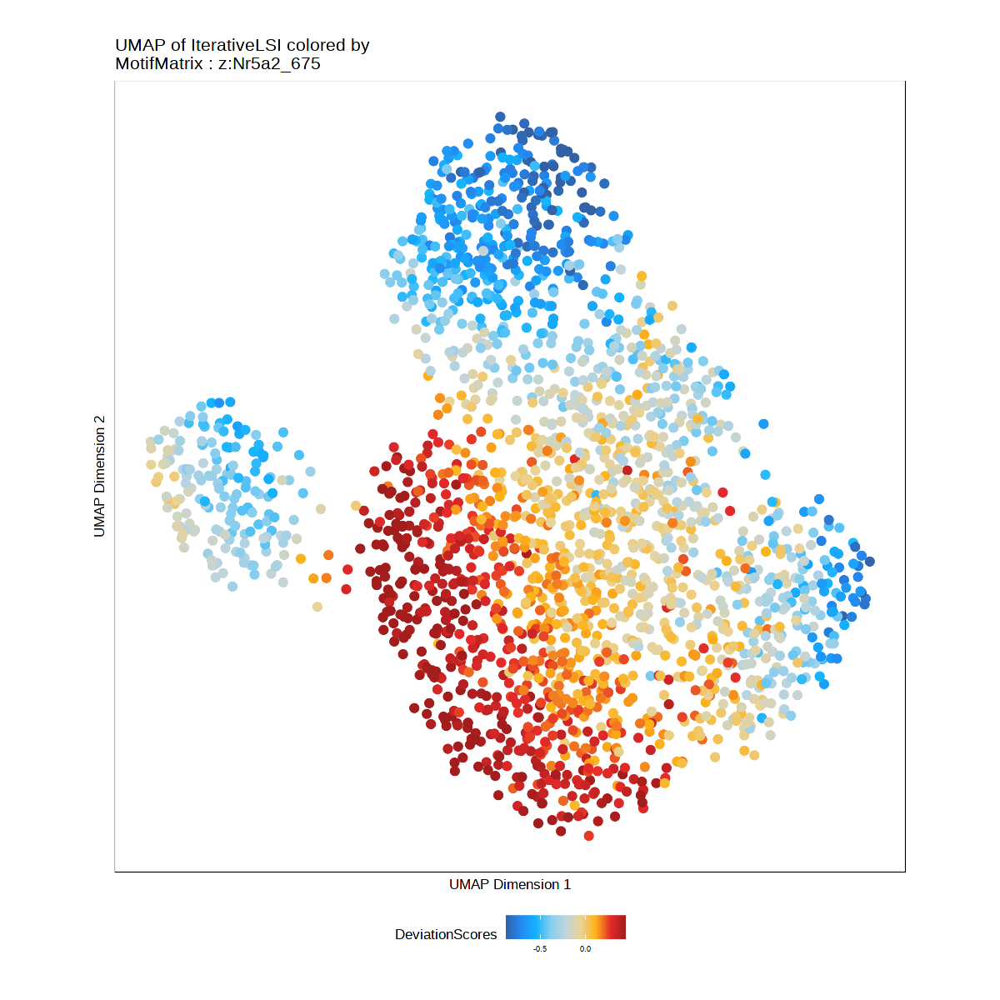

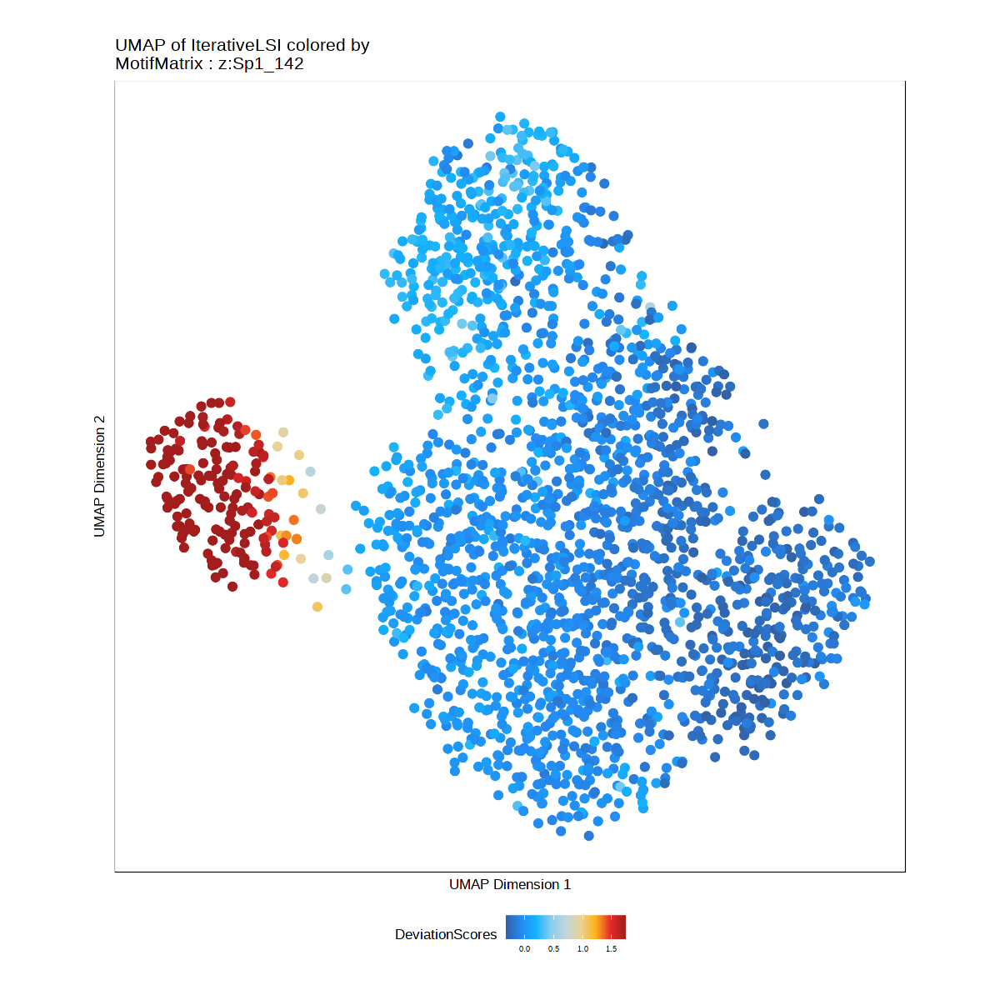

$`z:Atf2_112`

$`z:Bhlhe40_55`

$`z:Dbp_133`

$`z:Klf1_214`

$`z:Klf16_874`

$`z:Maz_807`

$`z:Nhlh2_84`

$`z:Nr5a2_675`

$`z:Sp1_142`

$`z:Sp4_167`

$`z:Tead4_868`


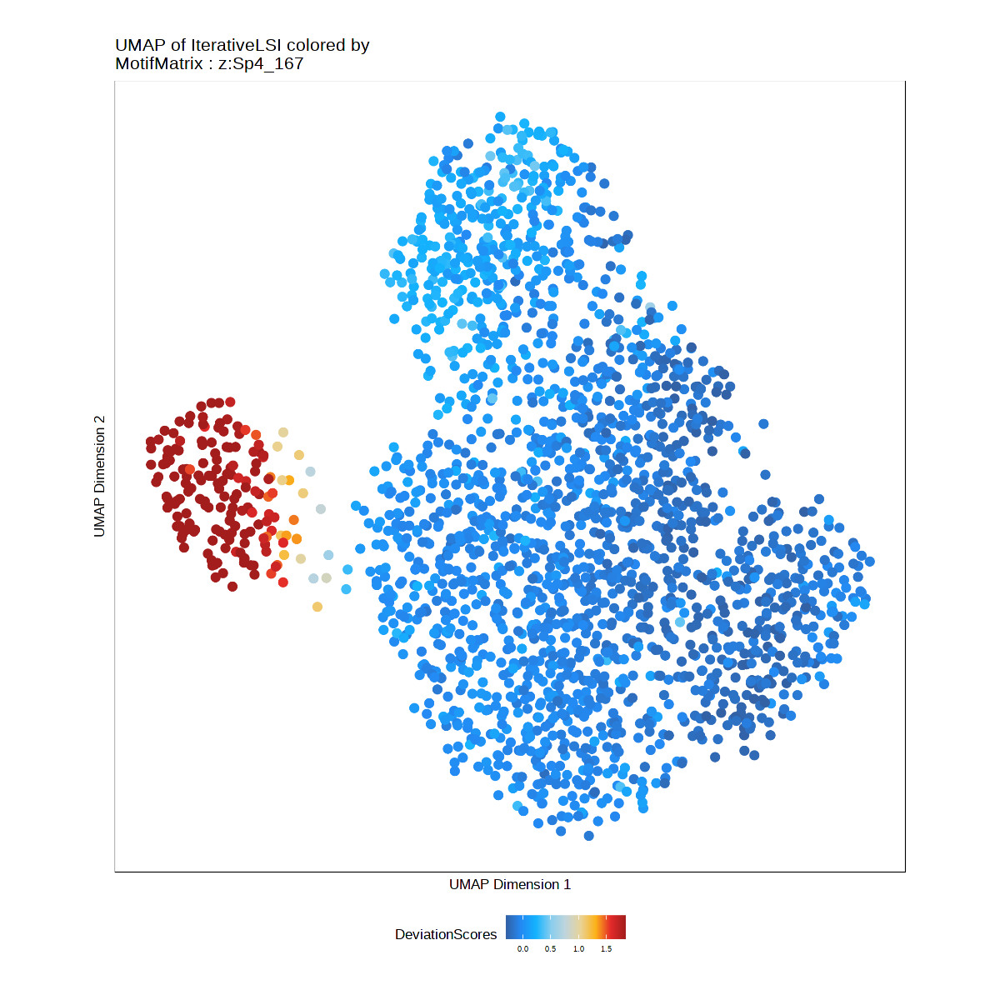

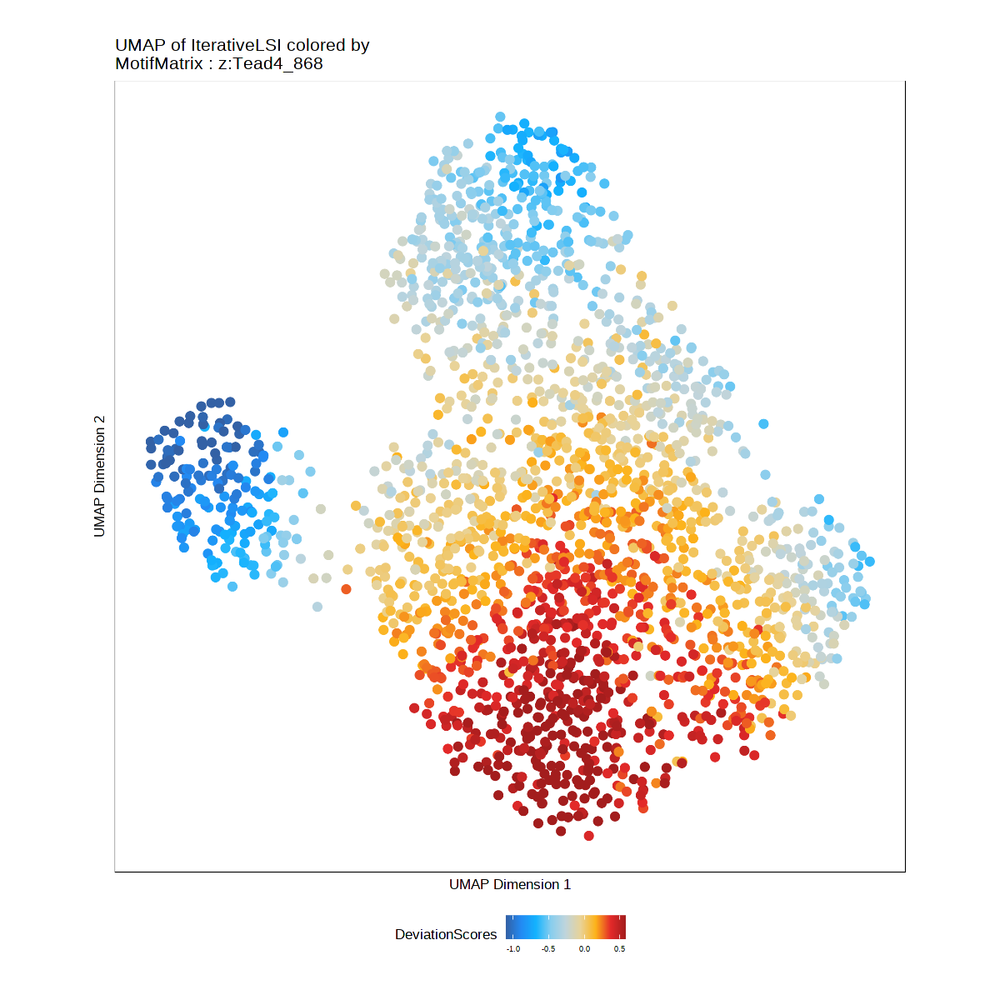

In [350]:
p <- plotEmbedding(
    ArchRProj = Merged.proj.SC, 
    colorBy = "MotifMatrix",
    name = c("z:Atf2_112", "z:Bhlhe40_55", "z:Dbp_133", "z:Klf1_214", "z:Klf16_874", "z:Maz_807", "z:Nhlh2_84", "z:Nr5a2_675", "z:Sp1_142", "z:Sp4_167", "z:Tead4_868"),
    embedding = "UMAP",
    quantCut = c(0.01, 0.95),
    imputeWeights = getImputeWeights(Merged.proj.SC),
    plotAs = "point",
    size =2 
)
p


In [293]:
Major.trajectory <- c("C4", "C6", "C5", "C3")
Merged.proj.SC <- addTrajectory(
    ArchRProj = Merged.proj.SC, 
    name = "Major_trajectory", 
    groupBy = "Seurat.Clusters",
    trajectory = Major.trajectory, 
    embedding = "UMAP", 
    force = TRUE
)


ArchR logging to : ArchRLogs/ArchR-addTrajectory-382b9241645-Date-2020-10-18_Time-11-53-09.log
If there is an issue, please report to github with logFile!

Filtering outliers

Initial Alignment Before Spline Fit

Spline Fit

KNN to Spline

Overriding previous entry for Major_trajectory

ArchR logging successful to : ArchRLogs/ArchR-addTrajectory-382b9241645-Date-2020-10-18_Time-11-53-09.log



ArchR logging to : ArchRLogs/ArchR-plotTrajectory-382b45ae23b4-Date-2020-10-18_Time-11-53-23.log
If there is an issue, please report to github with logFile!

Plotting

Warning message:
“Removed 639 rows containing non-finite values (stat_summary_hex).”
Plotting Trajectory

Adding Inferred Arrow Trajectory to Plot

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectory-382b45ae23b4-Date-2020-10-18_Time-11-53-23.log

Warning message:
“Removed 639 rows containing non-finite values (stat_summary_hex).”


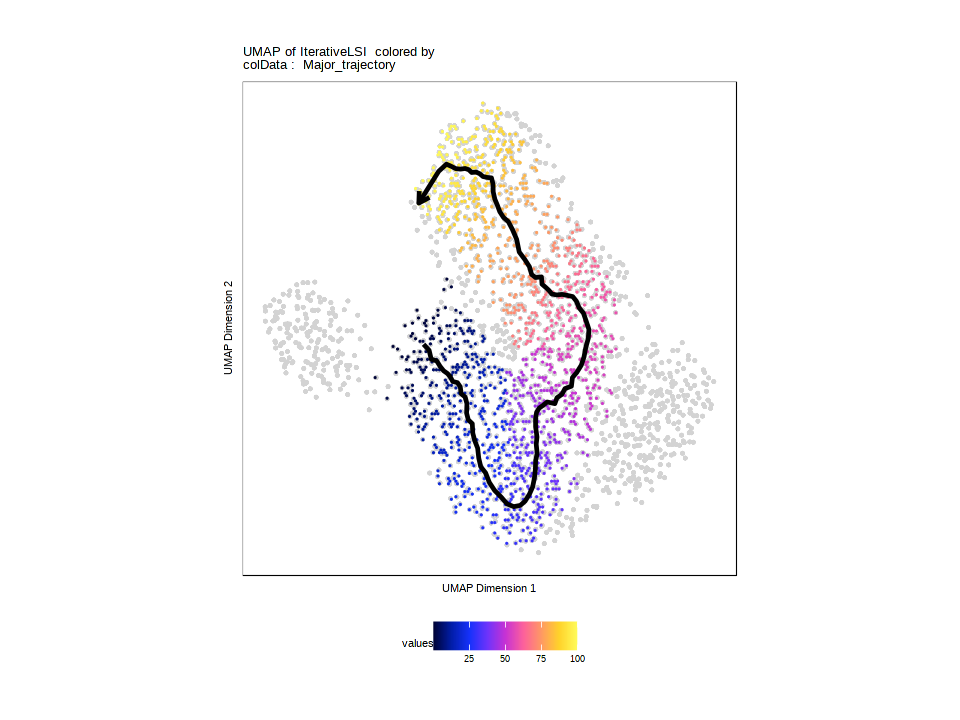

In [294]:
p <- plotTrajectory(Merged.proj.SC, trajectory = "Major_trajectory", colorBy = "cellColData", name = "Major_trajectory")
p[[1]]


In [295]:
plotPDF(p[[1]], name = "SC.traj", width = 5, height = 5)

Plotting Ggplot!

Warning message:
“Removed 639 rows containing non-finite values (stat_summary_hex).”
Warning message:
“Removed 639 rows containing non-finite values (stat_summary_hex).”


In [296]:
trajMM  <- getTrajectory(ArchRProj = Merged.proj.SC, name = "Major_trajectory", useMatrix = "MotifMatrix", log2Norm = FALSE)
p1 <- plotTrajectoryHeatmap(trajMM, pal = paletteContinuous(set = "solarExtra"),labelTop = 100)
p1

Creating Trajectory Group Matrix..

Some values are below 0, this could be a DeviationsMatrix in which scaleTo should be set = NULL.
Continuing without depth normalization!

Smoothing...

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-382b13ec970f-Date-2020-10-18_Time-11-54-39.log
If there is an issue, please report to github with logFile!

useSeqnames is NULL or greater than 1 with a Sparse.Assays.Matrix trajectory input.

2020-10-18 11:54:39 : 

force=FALSE thus continuing with subsetting useSeqnames = z

2020-10-18 11:54:39 : 

Preparing Main Heatmap..

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-382b13ec970f-Date-2020-10-18_Time-11-54-39.log



In [304]:
pdf("SC.traj.combine.pdf", width=5, height=4)
#options(repr.plot.height=20,repr.plot.width=8)
ComplexHeatmap::draw(ht1 + ht2, heatmap_legend_side = "bot", annotation_legend_side = "bot")
dev.off()

png 
  2

In [299]:
trajGSM <- getTrajectory(ArchRProj = Merged.proj.SC, name = "Major_trajectory", useMatrix = "GeneScoreMatrix", log2Norm = TRUE)
p2 <- trajectoryHeatmap(trajGSM,  pal = paletteContinuous(set = "horizonExtra"),labelTop = 100)
p2

Creating Trajectory Group Matrix..

Smoothing...

Warning message:
“'trajectoryHeatmap' is deprecated.
Use 'plotTrajectoryHeatmap' instead.
See help("Deprecated")”
ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-382b18627277-Date-2020-10-18_Time-11-56-44.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-382b18627277-Date-2020-10-18_Time-11-56-44.log



Creating Trajectory Group Matrix..

Smoothing...

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-f9bdb8c5c3-Date-2020-08-14_Time-16-52-36.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-f9bdb8c5c3-Date-2020-08-14_Time-16-52-36.log



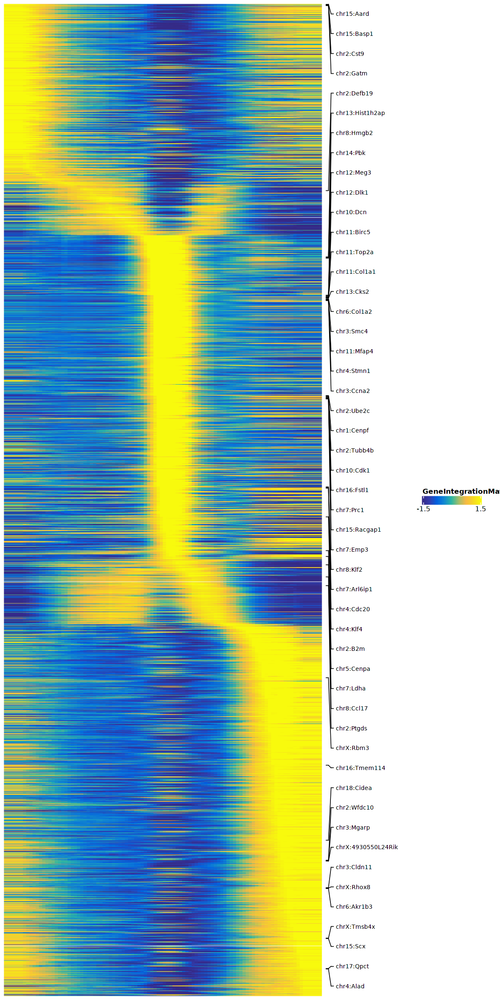

In [30]:
trajGIM <- getTrajectory(ArchRProj = Merged.proj.SC, name = "Major_trajectory", useMatrix = "GeneIntegrationMatrix", log2Norm = TRUE)
p3 <- plotTrajectoryHeatmap(trajGIM,  pal = paletteContinuous(set = "blueYellow"))
p3

In [301]:
#integration
corGSM_MM <- correlateTrajectories(trajGSM, trajMM,corCutOff = 0.2,varCutOff1=0.5,varCutOff2=0.5)
trajGSM2 <- trajGSM[corGSM_MM[[1]]$name1, ]
trajMM2 <- trajMM[corGSM_MM[[1]]$name2, ]

trajCombined <- trajGSM2
assay(trajCombined) <- t(apply(assay(
    trajGSM2), 1, scale)) + t(apply(assay(trajMM2), 1, scale))

combinedMat <- plotTrajectoryHeatmap(trajCombined, returnMat = TRUE, varCutOff = 0)
rowOrder <- match(rownames(combinedMat), rownames(trajGSM2))
ht1 <- plotTrajectoryHeatmap(trajGSM2,  pal = paletteContinuous(set = "horizonExtra"),  varCutOff = 0, rowOrder = rowOrder)
ht2 <- plotTrajectoryHeatmap(trajMM2, pal = paletteContinuous(set = "solarExtra"), varCutOff = 0, rowOrder = rowOrder)
ht1 + ht2

ArchR logging to : ArchRLogs/ArchR-correlateTrajectories-382b6a307c27-Date-2020-10-18_Time-12-02-50.log
If there is an issue, please report to github with logFile!

Found 23 Correlated Pairings!

2020-10-18 12:03:04 : 

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-382b345be1fd-Date-2020-10-18_Time-12-03-04.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-382b345be1fd-Date-2020-10-18_Time-12-03-04.log

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-382baff6b19-Date-2020-10-18_Time-12-03-04.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-382baff6b19-Date-2020-10-18_Time-12-03-04.log

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-382b4ed25128-Date-2020-10-18_Time-12-03-05.log
If there is an issue, please report to github with logFile!

use

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotTrajectory-382b57d9a89-Date-2020-10-18_Time-15-47-20.log
If there is an issue, please report to github with logFile!

Getting Matrix Values...

2020-10-18 15:47:20 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Plotting

Warning message:
“Removed 639 rows containing non-finite values (stat_summary_hex).”
Plotting Trajectory

Adding Inferred Arrow Trajectory to Plot

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectory-382b57d9a89-Date-2020-10-18_Time-15-47-20.log

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotTrajectory-382b49b09d96-Date-2020-10-18_Time-15-47-22.log
If there is an issue, please report to github with logFile!

Getting Matrix Values...

2020-10-18 15:47:23 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Plotting

Warning message:
“Removed 639 rows containing non-finite values (stat_summary_hex).”
Plotting Trajectory

Adding Inferred Arrow Trajectory 

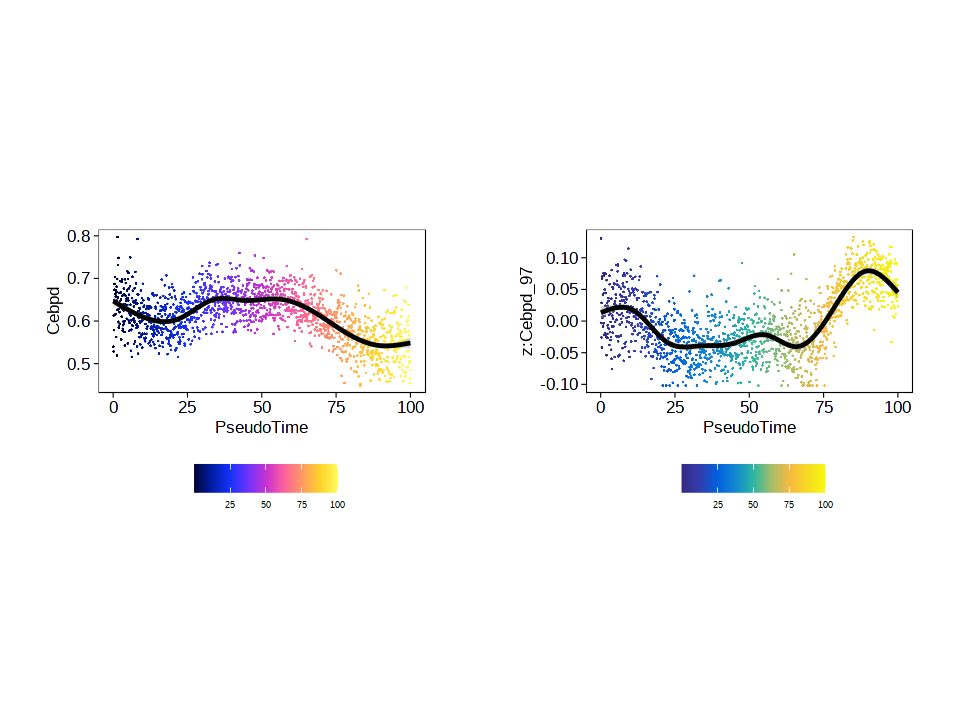

In [328]:
p1 <- plotTrajectory(Merged.proj.SC, trajectory = "Major_trajectory", colorBy = "GeneScoreMatrix", name = "Cebpd", continuousSet = "horizonExtra")
p2 <- plotTrajectory(Merged.proj.SC, trajectory = "Major_trajectory", colorBy = "MotifMatrix", name = "z:Cebpd_97", continuousSet = "blueYellow")
ggAlignPlots(p1[[2]], p2[[2]], type = "h")

### Find positive TF regulators

In [5]:
seGroupMotif <- getGroupSE(ArchRProj = Merged.proj.SC, useMatrix = "MotifMatrix", groupBy = "Seurat.Clusters")
seGroupMotif

ArchR logging to : ArchRLogs/ArchR-getGroupSE-7e2b2ae0288e-Date-2020-11-11_Time-12-23-22.log
If there is an issue, please report to github with logFile!

Getting Group Matrix

2020-11-11 12:23:22 : Constructing Group Matrix 1 of 2, 0 mins elapsed.

2020-11-11 12:23:25 : Finished Group Matrix 1 of 2, 0.038 mins elapsed.

2020-11-11 12:23:25 : Constructing Group Matrix 2 of 2, 0.038 mins elapsed.

2020-11-11 12:23:26 : Finished Group Matrix 2 of 2, 0.053 mins elapsed.

2020-11-11 12:23:26 : Successfully Created Group Matrix, 0.053 mins elapsed.

Normalizing by number of Cells

ArchR logging successful to : ArchRLogs/ArchR-getGroupSE-7e2b2ae0288e-Date-2020-11-11_Time-12-23-22.log



class: SummarizedExperiment 
dim: 1768 6 
metadata(0):
assays(1): MotifMatrix
rownames(1768): f1 f2 ... f1767 f1768
rowData names(3): seqnames idx name
colnames(6): C1 C2 ... C5 C6
colData names(20): TSSEnrichment ReadsInTSS ... Major_trajectory nCells

In [6]:
seZ <- seGroupMotif[rowData(seGroupMotif)$seqnames=="z",]
rowData(seZ)$maxDelta <- lapply(seq_len(ncol(seZ)), function(x){
  rowMaxs(assay(seZ) - assay(seZ)[,x])
}) %>% Reduce("cbind", .) %>% rowMaxs

In [7]:
corGSM_MM <- correlateMatrices(
    ArchRProj = Merged.proj.SC,
    useMatrix1 = "GeneScoreMatrix",
    useMatrix2 = "MotifMatrix",
    reducedDims = "IterativeLSI"
)
corGSM_MM

ArchR logging to : ArchRLogs/ArchR-correlateMatrices-7e2b6d105f3e-Date-2020-11-11_Time-12-23-35.log
If there is an issue, please report to github with logFile!

When accessing features from a matrix of class Sparse.Assays.Matrix it requires 1 seqname!
Continuing with first seqname 'z'!
If confused, try getFeatures(ArchRProj, 'MotifMatrix') to list out available seqnames for input!

2020-11-11 12:23:36 : Testing 793 Mappings!, 0.023 mins elapsed.

Filtering 1 dims correlated > 0.75 to log10(depth + 1)

2020-11-11 12:23:36 : Computing KNN, 0.024 mins elapsed.

2020-11-11 12:23:37 : Identifying Non-Overlapping KNN pairs, 0.032 mins elapsed.

2020-11-11 12:23:38 : Identified 481 Groupings!, 0.061 mins elapsed.

2020-11-11 12:23:39 : Getting Group Matrix 1, 0.068 mins elapsed.

2020-11-11 12:24:01 : Getting Group Matrix 2, 0.443 mins elapsed.

Some entries in groupMat2 are less than 0, continuing without Log2 Normalization.
Most likely this assay is a deviations matrix.

Getting Correlation

DataFrame with 793 rows and 14 columns
    GeneScoreMatrix_name MotifMatrix_name                 cor
                 <array>          <array>           <numeric>
1                  Sox17        Sox17_733   0.136972990167888
2                  Mybl1        Mybl1_647   0.298127600549622
3                    Msc           Msc_43   -0.15546043000798
4                 Arid5a         Arid5a_9 -0.0458537023476439
5                  Npas2         Npas2_44   0.284108707320373
...                  ...              ...                 ...
789                 Esx1         Esx1_444  -0.139239879426763
790                 Klf8         Klf8_194   -0.22741888007403
791               Mbtps2       Mbtps2_813  0.0106550385453866
792                 Zfy1         Zfy1_213   0.126937697074774
793                  Sry          Sry_748                  NA
                    padj                 pval GeneScoreMatrix_seqnames
               <numeric>            <numeric>                    <Rle>
1            

[1] "Atf2"    "Bhlhe40" "Dbp"     "Klf1"    "Klf16"   "Maz"     "Nhlh2"  
 [8] "Nr5a2"   "Sp1"     "Sp4"     "Tead4"

Warning message:
“Removed 8 rows containing missing values (geom_point).”


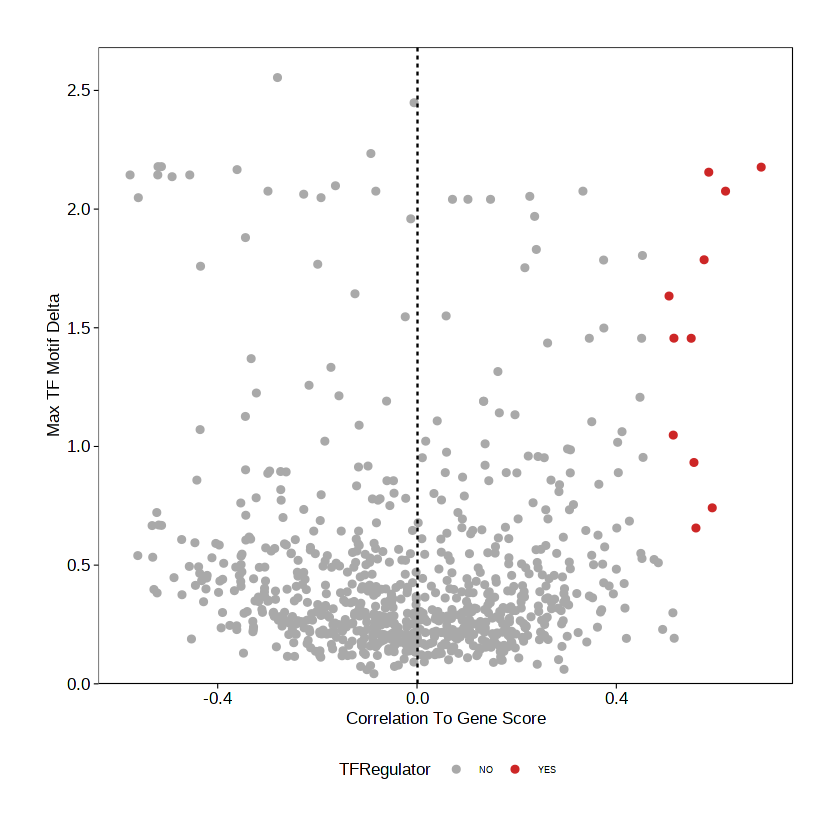

In [8]:
corGSM_MM$maxDelta <- rowData(seZ)[match(corGSM_MM$MotifMatrix_name, rowData(seZ)$name), "maxDelta"]
corGSM_MM <- corGSM_MM[order(abs(corGSM_MM$cor), decreasing = TRUE), ]
corGSM_MM <- corGSM_MM[which(!duplicated(gsub("\\-.*","",corGSM_MM[,"MotifMatrix_name"]))), ]
corGSM_MM$TFRegulator <- "NO"
corGSM_MM$TFRegulator[which(corGSM_MM$cor > 0.5 & corGSM_MM$padj < 0.01 & corGSM_MM$maxDelta > quantile(corGSM_MM$maxDelta, 0.75))] <- "YES"
sort(corGSM_MM[corGSM_MM$TFRegulator=="YES",1])

p <- ggplot(data.frame(corGSM_MM), aes(cor, maxDelta, color = TFRegulator)) +
  geom_point() + 
  theme_ArchR() +
  geom_vline(xintercept = 0, lty = "dashed") + 
  scale_color_manual(values = c("NO"="darkgrey", "YES"="firebrick3")) +
  xlab("Correlation To Gene Score") +
  ylab("Max TF Motif Delta") +
  scale_y_continuous(
    expand = c(0,0), 
    limits = c(0, max(corGSM_MM$maxDelta)*1.05)
  )

p

In [9]:
library(ggplot2)
library(gghighlight)
library(ggrepel)

In [14]:
## scatter plot
pdf(file="SC.positiveTF.pdf",width=5,height=5)
ggplot(data.frame(corGSM_MM), aes(cor, maxDelta, lable = GeneScoreMatrix_name))+ 
geom_point(colour="darkred",size=3) +
theme_ArchR()+
gghighlight(cor > 0.5 & padj < 0.01 & maxDelta > quantile(corGSM_MM$maxDelta, 0.75)) +
geom_label_repel(aes(label = GeneScoreMatrix_name),
                  box.padding   = 0.5, 
                 label.size = 0.1,
                  point.padding = 0.5,
                  segment.size = 0.5,
                  segment.color = 'grey50')
 dev.off()

Warning message:
“Removed 8 rows containing missing values (geom_point).”


png 
  2

In [104]:
saveArchRProject(ArchRProj = Merged.proj.SC,load = TRUE)

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
         

class: ArchRProject 
outputDirectory: /home/leetl/Gonocyte/Raw_data/Germcell.subset.newversion 
samples(4): P3 E18 P6 P0
sampleColData names(1): ArrowFiles
cellColData names(24): Sample TSSEnrichment ... Major_trajectory
  Minor_trajectory
numberOfCells(1): 710
medianTSS(1): 15.571
medianFrags(1): 11304.5